<a href="https://colab.research.google.com/github/Freeskyadam/BI-Specialized-Bootcamp/blob/main/Assignment_Day_9_10_Frizky_Adam_Pratama.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Salah satu perusahaan yang bergerak di bidang asuransi mengalami kesulitan dalam mengatasi dan mengendalikan jumlah kasus fraud. Anda sebagai data scientist yang bekerja di salah satu konsultan manajemen ternama diminta untuk melakukan otomatisasi pada pendeteksian fraud. Anda diberikan dataset dengan metadata sebagai berikut:
months_as_customer: lama user menjadi nasabah dalam hitungan bulan

age: usia nasabah

policy_number: nomor polis

policy_bind_date: tanggal polis

policy_state: wilayah polis, negara bagian

policy_csl: Combined single limit polis

policy_deductable: risiko yang ditanggung bersama

policy_annual_premium: premi tahunan

umbrella_limit: limit pembayaran risiko oleh perusahaan asuransi

insured_zip: kode pos nasabah

insured_sex: gender nasabah

insured_education_level: tingkat pendidikan nasabah

insured_occupation: pekerjaan nasabah

insured_hobbies: hobi nasabah

insured_relationship: status hubungan nasabah

capital-gains: besar gains yang diperoleh dari ganti rugi

capital-loss: besar loss yang diperoleh dari ganti rugi

incident_date: tanggal insiden terjadi

incident_type: tipe insiden

collision_type: tipe tabrakan

incident_severity: tingkah keparahan

authorities_contacted: pihak berwajib yang dihubungi

incident_state: lokasi insiden, negara bagian

incident_city: kota terjadinya insiden

incident_location: lokasi terjadinya insiden

incident_hour_of_the_day: jam terjadinya insiden

number_of_vehicles_involved: jumlah kendaraan yang ikut dalam insiden

property_damage: apakah terdapat kerusakan properti? YES jika ya

bodily_injuries: jumlah korban luka

witness: jumlah saksi mata

police_report_available: apakah terdapat laporan polisi? YES jika ya

total_claim_amount: total klaim

injury_claim: klaim untuk luka-luka

property_claim: klaim untuk kerusakan properti

vehicle_claim: klaim untuk kerusakan mobil

auto_make: merek otomotif

auto_model: model otomotif

auto_year: tahun pembuatan mobil

fraud_reported: apakah terlapor sebagai fraud? Y jika ya


# Install, Load Package, Import data, Visualitation, preprosesing


In [ ]:
!pip install skope-rules
!pip install eli5
!pip install scikit-plot
!pip install dalex
!pip install shap
!pip install lime


In [ ]:
!pip install -U xgboost

In [ ]:
import six
import sys
sys.modules['sklearn.externals.six'] = six
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='whitegrid')
sns.set_palette("bright")

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

from sklearn.model_selection import train_test_split
import sklearn.metrics as metrics
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree, export_text
import statsmodels.api as sm
import statsmodels.formula.api as smf
from skrules import SkopeRules
import scikitplot as skplt
import eli5
from scipy import stats
import scipy.stats as stats
from scipy.stats import chi2_contingency
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from xgboost import XGBClassifier
import dalex as dx
import shap
from lime.lime_tabular import LimeTabularExplainer 
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_validate, StratifiedKFold, RandomizedSearchCV, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import auc,roc_auc_score
from sklearn.metrics import roc_auc_score, roc_curve, RocCurveDisplay, precision_recall_curve, PrecisionRecallDisplay

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
def correlation_ratio(categories, measurements):
    fcat, _ = pd.factorize(categories)
    cat_num = np.max(fcat)+1
    y_avg_array = np.zeros(cat_num)
    n_array = np.zeros(cat_num)
    for i in range(0,cat_num):
        cat_measures = measurements[np.argwhere(fcat == i).flatten()]
        n_array[i] = len(cat_measures)
        y_avg_array[i] = np.average(cat_measures)
    y_total_avg = np.sum(np.multiply(y_avg_array,n_array))/np.sum(n_array)
    numerator = np.sum(np.multiply(n_array,np.power(np.subtract(y_avg_array,y_total_avg),2)))
    denominator = np.sum(np.power(np.subtract(measurements,y_total_avg),2))
    if numerator == 0:
        eta = 0.0
    else:
        eta = np.sqrt(numerator/denominator)
    return eta

def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x,y)
    chi2 = stats.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r,k = confusion_matrix.shape
    phi2corr = max(0, phi2-((k-1)*(r-1))/(n-1))
    rcorr = r-((r-1)**2)/(n-1)
    kcorr = k-((k-1)**2)/(n-1)
    return np.sqrt(phi2corr/min((kcorr-1),(rcorr-1)))


def create_stacked_bar_percent(df,column_name):
        
    default_by_group = pd.crosstab(index=df['fraud_reported'],columns = df[column_name], normalize = 'columns')
    default_by_group = default_by_group[default_by_group.iloc[1].sort_values().index]
    
    default_by_group = default_by_group.apply(lambda x: round(x,2))
    
    labels = default_by_group.columns
    list1 = default_by_group.iloc[0].to_list()
    list2 = default_by_group.iloc[1].to_list()
    
    list1_name = "Not Fraud"
    list2_name = "Fraud"
    title = f" %Fraud by {column_name}"
    xlabel = column_name
    ylabel = "Number of Fraud"
    
    fig, ax = plt.subplots(figsize=(8,8),dpi=100)
    bar_width = 0.5
    
    ax1 = ax.bar(labels,list1, bar_width, label = list1_name)
    ax2 = ax.bar(labels,list2, bar_width, bottom = list1, label = list2_name)

    ax.set_title(title, fontweight = "bold",fontsize=12)
    ax.set_xlabel(xlabel, fontweight = "bold",fontsize=12)
    ax.set_ylabel(ylabel, fontweight = "bold",fontsize=12)
    ax.legend(loc="upper right")
    
    plt.xticks(list(range(len(labels))), labels,rotation=90)
    plt.yticks(fontsize=12)

    for r1, r2 in zip(ax1, ax2):
        h1 = r1.get_height()
        h2 = r2.get_height()
        plt.text(r1.get_x() + r1.get_width() / 2., h1 / 2., f"{h1:.0%}", ha="center", va="center", color="black", fontsize=12, fontweight="bold")
        plt.text(r2.get_x() + r2.get_width() / 2., h1 + h2 / 2., f"{h2:.0%}", ha="center", va="center", color="black", fontsize=12, fontweight="bold")

    plt.show()

def diagnostic_plots(df, variable):

    plt.figure(figsize=(16, 4))

    plt.subplot(1, 3, 1)
    sns.histplot(df[variable], bins=30)
    plt.title('Histogram')

    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.ylabel('RM quantiles')

    plt.subplot(1, 3, 3)
    sns.boxplot(y=df[variable])
    plt.title('Boxplot')

    plt.show()

import warnings
warnings.filterwarnings("ignore")

In [ ]:
df = pd.read_csv("https://raw.githubusercontent.com/hadimaster65555/dataset_for_teaching/main/dataset/car_insurance_fraud_dataset/insuranceFraud.csv")

In [ ]:
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,10/17/2014,OH,250/500,1000,1406.91,0,466132,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,6/27/2006,IN,250/500,2000,1197.22,5000000,468176,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,9/6/2000,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,5/25/1990,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,6/6/2014,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N


# 1. Identifikasi berapa banyak nilai null yang terdapat di dalam dataset. Perhatian: nilai null pada dataset tidak selalu NA atau NULL

In [ ]:
df.isnull().values.any().sum()

0

jika di lihat kolom bernilai null adalah 0 namun pada kolom collison_type,property_damage,police_report_available terdapat "?", bisa disimpulkan pada kolom tersebut terjadi salah penginputan data, kemudian lanjutkan analisa lebih mendalam, Check unique value

In [ ]:
for x in df.columns:
  print(f"unik dari {x}")
  print(f"{df[x].unique()}")
  print()

unik dari months_as_customer
[328 228 134 256 137 165  27 212 235 447  60 121 180 473  70 140 160 196
 460 217 370 413 237   8 257 202 224 241  64 166 155 114 149 147  62 289
 431 199  79 116  37 106 269 265 163 355 175 192 430  91 223 195  22 439
  94  11 151 154 245 119 215 295 254 107 478 128 338 271 222 120 270 319
 194 227 244  78 200 284 275 153  31  41 127  61 207 219  80 325  29 239
 279 350 464 118 298  87 261 453 210 168 390 258 225 164 255 206 203 211
 274  81 280 112  24  93 171 124 287 122 398 214 209  82 193 288 104 101
 375 461 428  45 136 216 278 108  14 276  47  73 294 324  53 426 111  86
 296 125 177 238 449 252 359  19 285  30 342 468 343 404  63 335 142 272
  69  38 281 246 330 362 371 377 172  99 249 190 174  95   2 117 242 440
  20 208 156 232  84 394  35 369 332 243 264  32 259 186 201 436 189 105
  88  40  59  39 123 231 247  48 267 286 253  10 158   1  85 233 266  97
 399 305 129 283  96 176 159 290 299  66 334 429  15 230 250  65 475  77
 229 110 292 451 150 2

Setelah di cek, pada kolom umbrella_limit terdapat nilai yang cukup aneh yaitu -10000 jika diperhatikan pada nilai yg lain di kolom yg sama seharusnya tida dapat bernilai negatif maka ada bisa dikatakan bahwa nilai ini salah input, dan untuk nilai 0 dapat dikatakan bahwa ada beberapa kejadian atau kasus yg tidak dilakukan pembayarannya oleh pihak asuransi, jadi masih dapat dikatakan wajar.

# 1. Indentifikasi Jumlah Null Pada Dataset

In [ ]:
#mengganti nilai -10000 menjadi 10000
df["umbrella_limit"] = df["umbrella_limit"].replace(-1000000,1000000)
df["umbrella_limit"].unique()

array([       0,  5000000,  6000000,  4000000,  3000000,  8000000,
        7000000,  9000000, 10000000,  1000000,  2000000])

In [ ]:
#mengganti "?"" dengan nan
col_replace = ['collision_type','property_damage','police_report_available']
df[col_replace] = df[col_replace].replace("?",np.nan)
df.isnull().sum()

months_as_customer               0
age                              0
policy_number                    0
policy_bind_date                 0
policy_state                     0
policy_csl                       0
policy_deductable                0
policy_annual_premium            0
umbrella_limit                   0
insured_zip                      0
insured_sex                      0
insured_education_level          0
insured_occupation               0
insured_hobbies                  0
insured_relationship             0
capital-gains                    0
capital-loss                     0
incident_date                    0
incident_type                    0
collision_type                 178
incident_severity                0
authorities_contacted            0
incident_state                   0
incident_city                    0
incident_location                0
incident_hour_of_the_day         0
number_of_vehicles_involved      0
property_damage                360
bodily_injuries     

In [ ]:
df.isnull().sum().sum()

881

Hasil analisa
Nilai null pada dataset di indikasi dengan tanda "?", sehingga perlu di proses dengan mengubahnya menjadi nilai Null atau NaN. Dari hasil proses terlihat bahwa kolom collision_type,property_damage,police_report_available dengan total nilai missing pada data set adalah sebesar 881

#2. Treatment Missing values

In [ ]:
df[col_replace] = df[col_replace].fillna("UNKNOWN")
df.isnull().sum()

months_as_customer             0
age                            0
policy_number                  0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_rep

In [ ]:
for i in col_replace:
  print(f"{df[i].value_counts()/len(df)}")
  print()

Rear Collision     0.292
Side Collision     0.276
Front Collision    0.254
UNKNOWN            0.178
Name: collision_type, dtype: float64

UNKNOWN    0.360
NO         0.338
YES        0.302
Name: property_damage, dtype: float64

UNKNOWN    0.343
NO         0.343
YES        0.314
Name: police_report_available, dtype: float64



Bedasarkan analisa diatas, terlihat setiap nilai dapat dikatakan memiliki nilai relative dekat, jika mengimputasi nilai missing pada kolom tersebut dengan menggunakan modus dirasa kurang benar, dan bedasarkan pertimbangan missing values yang cukup besar sekitar 30% dan tidak mengetahui apa yg mengakibatkan missing value ini, dan tidak dapat diambil kepastian secara gegabah karena akan berakibat dengan model yg akan dijalankan, maka akan dilakukan imputasi dengan nilai Unknown, tetapi jika hasil analisa nilai Unknown tidak memberikan informasi, maka akan dilakukan imputasi yang lain.


# 3. Analisis Target Variable

In [ ]:
col_keep = ['policy_number','policy_csl','policy_annual_premium', 'umbrella_limit','insured_occupation',
       'insured_relationship', 'capital-gains', 'capital-loss','incident_type','insured_sex',
       'insured_education_level', 'insured_hobbies','collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state','number_of_vehicles_involved', 
       'property_damage', 'bodily_injuries','witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'fraud_reported',"incident_date"]

df = df[col_keep]
df = df.set_index('policy_number')
df.head()

,policy_csl,policy_annual_premium,umbrella_limit,insured_occupation,insured_relationship,capital-gains,capital-loss,incident_type,insured_sex,insured_education_level,...,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,fraud_reported,incident_date
policy_number,,,,,,,,,,,,,,,,,,,,,
521585,250/500,1406.91,0,craft-repair,husband,53300,0,Single Vehicle Collision,MALE,MD,...,YES,1,2,YES,71610,6510,13020,52080,Y,1/25/2015
342868,250/500,1197.22,5000000,machine-op-inspct,other-relative,0,0,Vehicle Theft,MALE,MD,...,UNKNOWN,0,0,UNKNOWN,5070,780,780,3510,Y,1/21/2015
687698,100/300,1413.14,5000000,sales,own-child,35100,0,Multi-vehicle Collision,FEMALE,PhD,...,NO,2,3,NO,34650,7700,3850,23100,N,2/22/2015
227811,250/500,1415.74,6000000,armed-forces,unmarried,48900,-62400,Single Vehicle Collision,FEMALE,PhD,...,UNKNOWN,1,2,NO,63400,6340,6340,50720,Y,1/10/2015
367455,500/1000,1583.91,6000000,sales,unmarried,66000,-46000,Vehicle Theft,MALE,Associate,...,NO,0,1,NO,6500,1300,650,4550,N,2/17/2015


In [ ]:
df['fraud_reported'] = df["fraud_reported"].replace(["Y","N"],[1,0])
df['fraud_reported'].unique()

array([1, 0])

In [ ]:
df["incident_date"] = pd.to_datetime(df["incident_date"])
df[df["incident_date"]>"2015-02-15"].shape[0]/df[df["incident_date"]<="2015-02-15"].shape[0]

0.30718954248366015

In [ ]:
df_train = df[df["incident_date"]<="2015-02-15"].copy()
df_test = df[df["incident_date"]>"2015-02-15"].copy()

df_train  = df_train.drop("incident_date",axis=1)
df_test  = df_test.drop("incident_date",axis=1)

Untuk proses splitting tidak dilakukan secara acak dikarenakan, jika dilihat dari laporan kecurangan selalu memiliki perubahaan behavior yg tidak menentu dari waktu ke waktu akan dapat menjadi relevan dengan mempelajari behavior masa lalu untuk memprediksi terjadinya kecurangan diwaktu yang akan datang

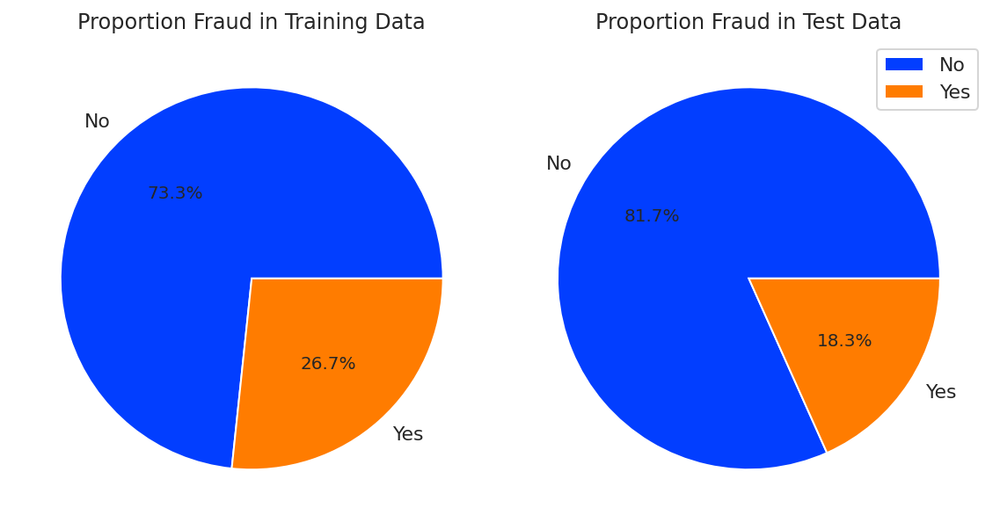

In [ ]:
plt.figure(figsize=(8,8))
plt.subplot(121)
plt.pie(df_train['fraud_reported'].value_counts(),autopct='%1.1f%%',labels=["No","Yes"])
plt.title('Proportion Fraud in Training Data')

plt.subplot(122)
plt.pie(df_test['fraud_reported'].value_counts(),autopct='%1.1f%%',labels=["No","Yes"])
plt.title('Proportion Fraud in Test Data')

plt.legend()
plt.tight_layout()
plt.show()

1.Perbandingan fraud dengan tidak fraud tidak seimbang, tetapi tidak terlalu besar perbedaannya.

2.Pada periode waktu 2015-01-01 hingga 2015-02-15 telah terjadi kasus fraud sebesar 26.7% atau 204 kasus dan pada periode waktu 2015-02-16 hingga 2015-03-01 telah terjadi kasus fraud sebesar 18.3% atau 140 kasus.


In [ ]:
num  = df_train.select_dtypes(exclude="object").columns
cat = df_train.select_dtypes(include="object").columns

len(num)

12

In [ ]:
df_train[num].head()

,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,fraud_reported
policy_number,,,,,,,,,,,,
521585,1406.91,0,53300,0,1,1,2,71610,6510,13020,52080,1
342868,1197.22,5000000,0,0,1,0,0,5070,780,780,3510,1
227811,1415.74,6000000,48900,-62400,1,1,2,63400,6340,6340,50720,1
104594,1351.10,0,0,0,3,0,2,64100,6410,6410,51280,1
413978,1333.35,0,0,-77000,3,0,0,78650,21450,7150,50050,0


Check Outlier

No handles with labels found to put in legend.


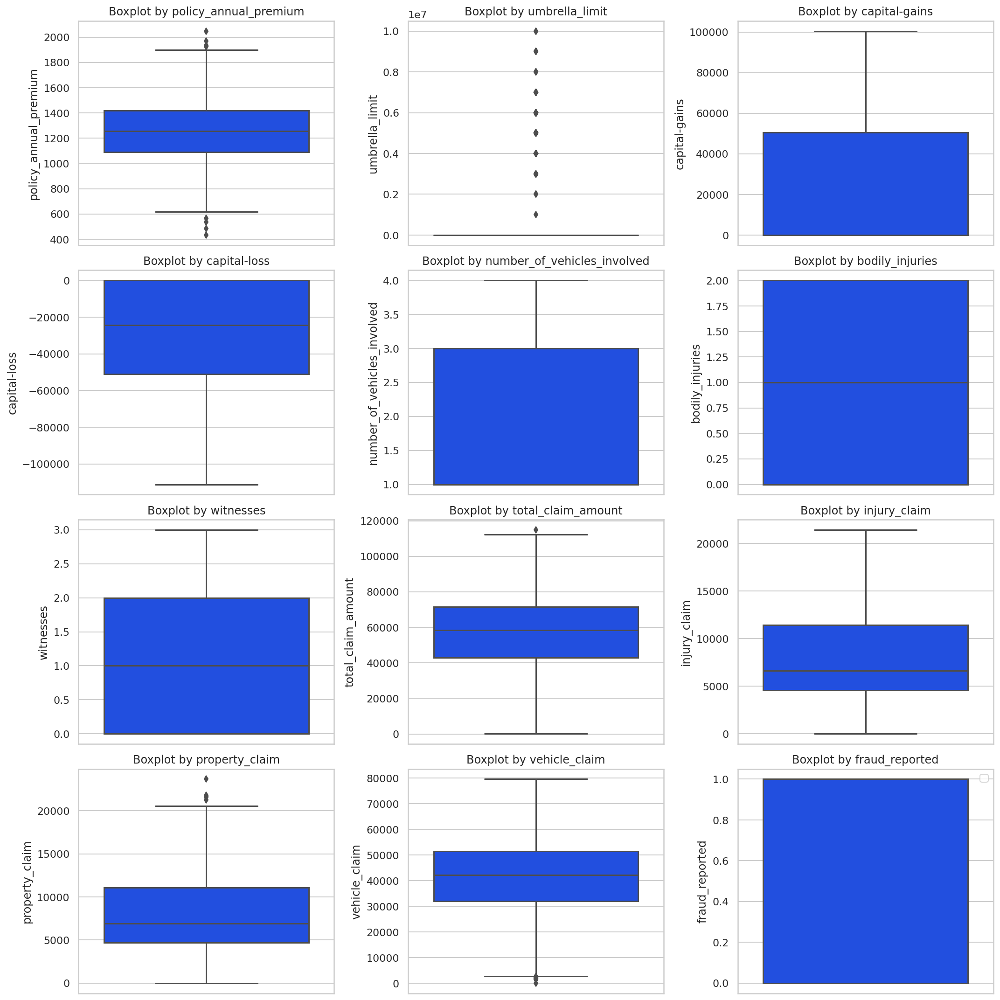

In [ ]:
plt.figure(figsize=(15,15))

for x in range(0,len(num)):
  plt.subplot(4,3,x+1)
  sns.boxplot(data=df_train,y=df_train[num[x]])
  plt.title(f"Boxplot by {num[x]}")
  plt.tight_layout()
plt.legend(loc="best")
plt.show()

Terdapat bebrapa kolom yang memiliki outliers namun nilainya tidak terlalu besar dan masih dalam batas yg wajar, sehingga tidak akan di hilangkan atau diganti datanya, untuk kolom umbrella limit outliers terlihat besar hal ini disebabkan dikarenakan memang untuk limit nya berbeda beda pada tiap kasus sehingga tidak dikatakan outliers.

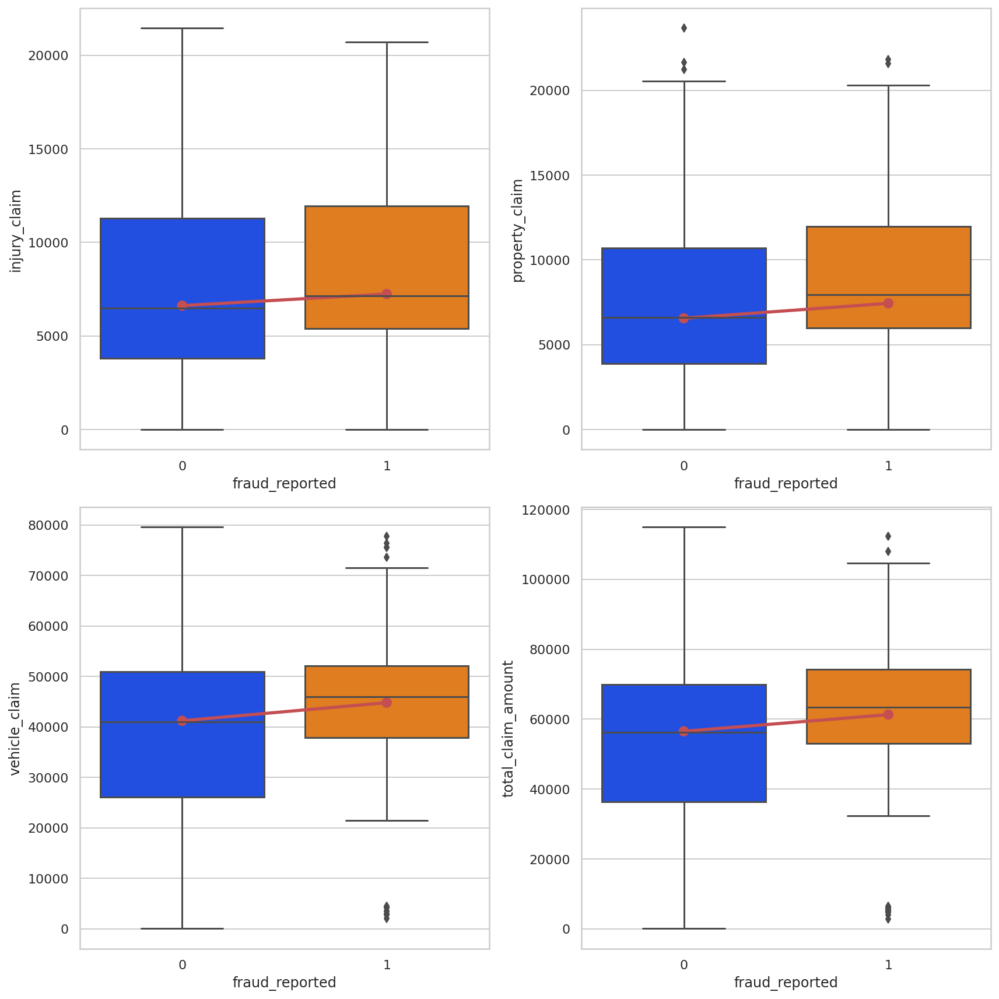

In [ ]:
claim = ["injury_claim","property_claim","vehicle_claim","total_claim_amount"]

plt.figure(figsize=(12,12))
for x in range(0,len(claim)):
  plt.subplot(2,2,x+1)
  sns.boxplot(data=df_train,x='fraud_reported',y=claim[x],dodge =True)
  sns.pointplot(x='fraud_reported', y=claim[x], data=df.groupby('fraud_reported', as_index=False).median(),color='r')
  plt.tight_layout()
plt.show()

dari data diatas dapat terlihat bahwa mereka yang melakukan fraud, melakukan klaim yang lebih tinggi dari yang tidak melakukan fraud, hal ini disebabkan mereka yg melakukan fraud mengharapkan mendapatkan lebih banyak uang dengan cara membuat laporan palsu/fraud.

Jika diperhatikan ada kasus fraud dimana nilai claimnya mendekati 0 hal ini dikarenakan setelah dilakukan penyelidikan lebih mendalam terhadap insiden yg terjadi penggantian asuransinya hanya bernilai kecil.

In [ ]:
df_train[(df_train["fraud_reported"]==1)&(df_train["total_claim_amount"]<20000)]

,policy_csl,policy_annual_premium,umbrella_limit,insured_occupation,insured_relationship,capital-gains,capital-loss,incident_type,insured_sex,insured_education_level,...,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,fraud_reported
policy_number,,,,,,,,,,,,,,,,,,,,,
342868,250/500,1197.22,5000000,machine-op-inspct,other-relative,0,0,Vehicle Theft,MALE,MD,...,1,UNKNOWN,0,0,UNKNOWN,5070,780,780,3510,1
608513,100/300,848.07,3000000,exec-managerial,not-in-family,31000,-30200,Vehicle Theft,MALE,JD,...,1,YES,2,1,UNKNOWN,5720,1040,520,4160,1
602410,250/500,1463.07,0,armed-forces,own-child,0,0,Vehicle Theft,MALE,MD,...,1,UNKNOWN,1,1,NO,5300,530,530,4240,1
779075,100/300,1348.32,0,craft-repair,wife,37600,-37600,Vehicle Theft,FEMALE,Associate,...,1,NO,2,1,UNKNOWN,4730,860,860,3010,1
832746,500/1000,994.74,0,adm-clerical,own-child,0,-55300,Parked Car,FEMALE,High School,...,1,NO,2,2,YES,5580,620,620,4340,1
903203,500/1000,814.96,6000000,priv-house-serv,not-in-family,68500,0,Parked Car,FEMALE,PhD,...,1,UNKNOWN,2,2,NO,6400,640,1280,4480,1
714738,500/1000,791.47,0,armed-forces,unmarried,0,0,Vehicle Theft,MALE,Masters,...,1,NO,1,2,NO,6300,630,1260,4410,1
550294,500/1000,1526.61,0,handlers-cleaners,not-in-family,0,-32900,Vehicle Theft,MALE,Masters,...,1,YES,2,2,UNKNOWN,4620,840,840,2940,1
276804,100/300,995.70,5000000,priv-house-serv,unmarried,0,0,Parked Car,FEMALE,JD,...,1,UNKNOWN,2,1,UNKNOWN,5000,500,1000,3500,1


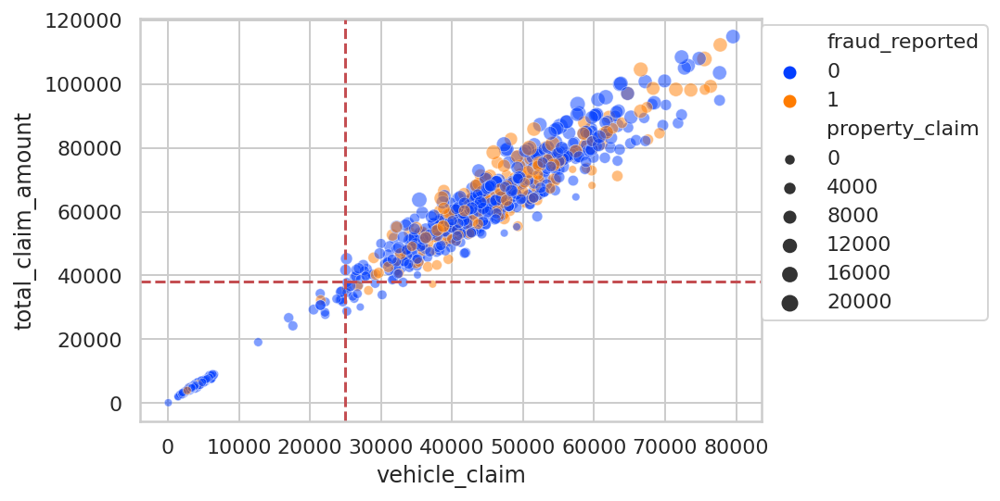

In [ ]:
sns.scatterplot(data=df_train,x="vehicle_claim",y="total_claim_amount",size="property_claim",hue="fraud_reported",alpha=0.5)
plt.axvline(x=25000,color="r",linestyle="--")
plt.axhline(y=38000,color="r",linestyle="--")
plt.legend(loc=(1,0.25))

seperti yang terlihat dari data diatas kebanyakan nilai untuk fraud terjadi ketika total claim diatas 39000 dan vehicle diatas 25000 ribu

hal ini membuktikan bahwa nilai fraud akan selalu tinggi dikarenakan mereka yg melakukan fraud mengharapkan untuk mendapatkan uang yg lebih banyak dari yg seharusnya mereka terima

In [ ]:
df_train["warning_claim"] = np.where((df_train["vehicle_claim"]<=25000)&(df_train["total_claim_amount"]<=38000),0,1)
df_test["warning_claim"] = np.where((df_test["vehicle_claim"]<=25000)&(df_test["total_claim_amount"]<=38000),0,1)

In [ ]:
df_train.groupby("warning_claim").agg({"fraud_reported":[len,"sum","mean"]})

fraud_reported               
                         len  sum      mean
warning_claim                              
0                        146   13  0.089041
1                        619  191  0.308562

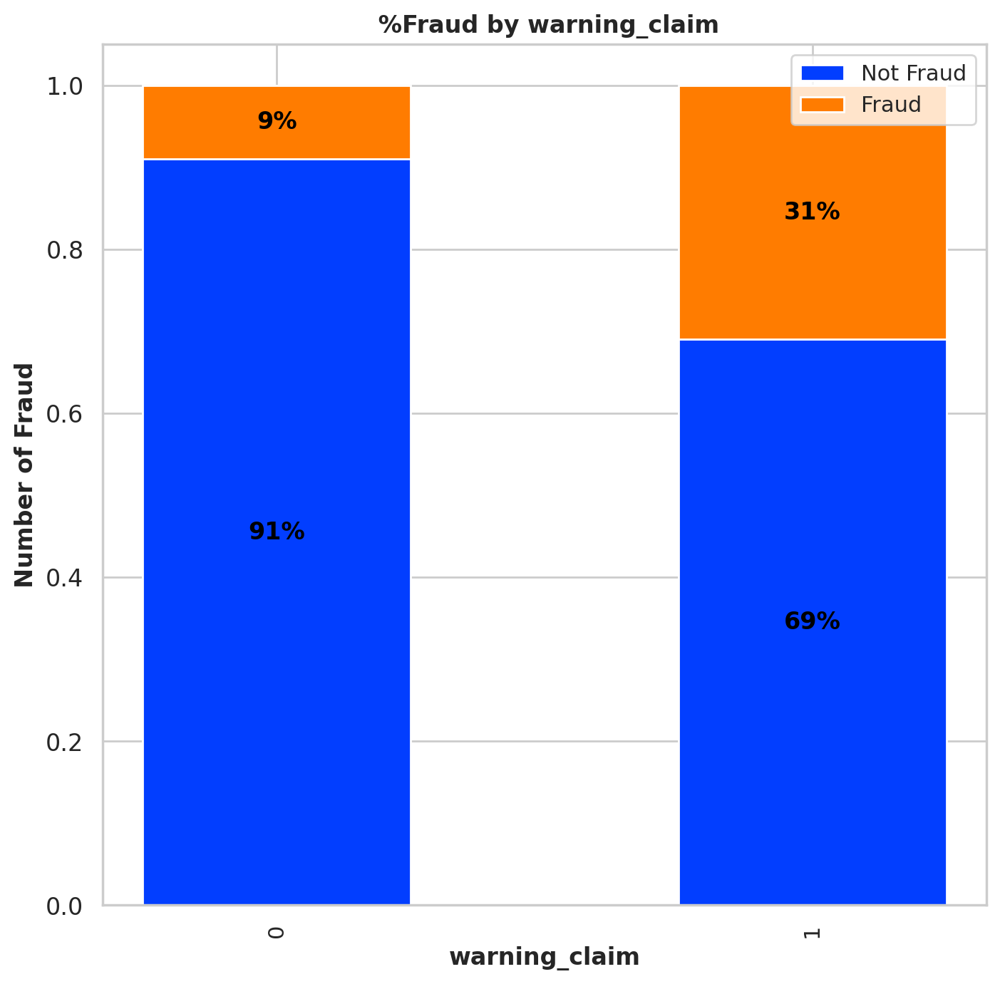

In [ ]:
create_stacked_bar_percent(df_train,"warning_claim")

dari data diatas menjelaskan bahwa terjadi 31% fraud ketika total claim diatas 39000 dan vehicle diatas 25000 ribu

In [ ]:
cramers = []
for i in df_train.select_dtypes(exclude = 'number').columns:
    cramers.append(cramers_v(df_train['fraud_reported'], df_train[i]))
res = pd.DataFrame(data = [df_train.select_dtypes(exclude = 'number').columns, cramers] 
             ).T 
res.columns = ['Column', 'Cramers_V']
res.sort_values(by = 'Cramers_V', ascending = False).reset_index(drop = True)

,Column,Cramers_V
0,incident_severity,0.556942
1,insured_hobbies,0.372676
2,collision_type,0.171598
3,incident_type,0.168875
4,authorities_contacted,0.158053
5,incident_state,0.134385
6,property_damage,0.083365
7,policy_csl,0.055306
8,insured_occupation,0.014137
9,insured_relationship,0.0


Bedasarkan dari efek crammer, terlihat 4 kolom yang tidak memiliki kontribusi terhadap terjadinya fraud, yaitu kolom insured_relationship,insured_sex,insured_education_level,police_report_available sehingga kolom kolom tersebut bisa dihilangkan

In [ ]:
df_train = df_train.drop(['insured_relationship','insured_sex','insured_education_level','police_report_available'],axis=1)
df_test = df_test.drop(['insured_relationship','insured_sex','insured_education_level','police_report_available'],axis=1)

df.new = df_train.select_dtypes(include='object').columns
df.new

Index(['policy_csl', 'insured_occupation', 'incident_type', 'insured_hobbies',
       'collision_type', 'incident_severity', 'authorities_contacted',
       'incident_state', 'property_damage'],
      dtype='object')

In [ ]:
for x in df.new:
  print(df_train.groupby(x).agg({"fraud_reported":[len,"sum","mean"]}))
  print()

           fraud_reported              
                      len sum      mean
policy_csl                             
100/300               259  68  0.262548
250/500               263  81  0.307985
500/1000              243  55  0.226337

                   fraud_reported              
                              len sum      mean
insured_occupation                             
adm-clerical                   41   7  0.170732
armed-forces                   51  13  0.254902
craft-repair                   60  17  0.283333
exec-managerial                63  24  0.380952
farming-fishing                42  13  0.309524
handlers-cleaners              38   8  0.210526
machine-op-inspct              71  18  0.253521
other-service                  51  10  0.196078
priv-house-serv                57  11  0.192982
prof-specialty                 65  15  0.230769
protective-serv                47  13  0.276596
sales                          61  16  0.262295
tech-support                   62  20  

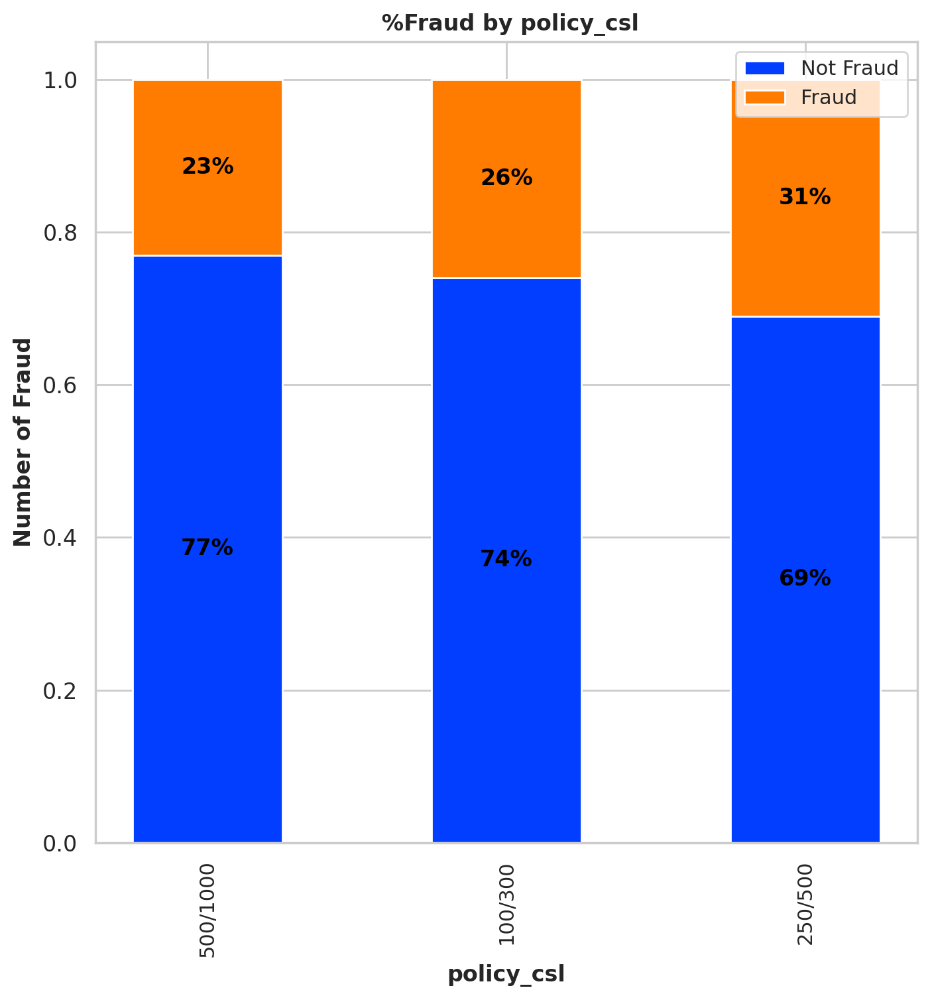

In [ ]:
create_stacked_bar_percent(df_train,"policy_csl")

31% fraud terjadi ketika policy_csl bernilai 250/500. bedasarkan hal ini maka dibuatkan ranking bedasarkan presentasi fraud yg terjadi.

1 = 500/1000

2 = 100/300

3 = 250/500

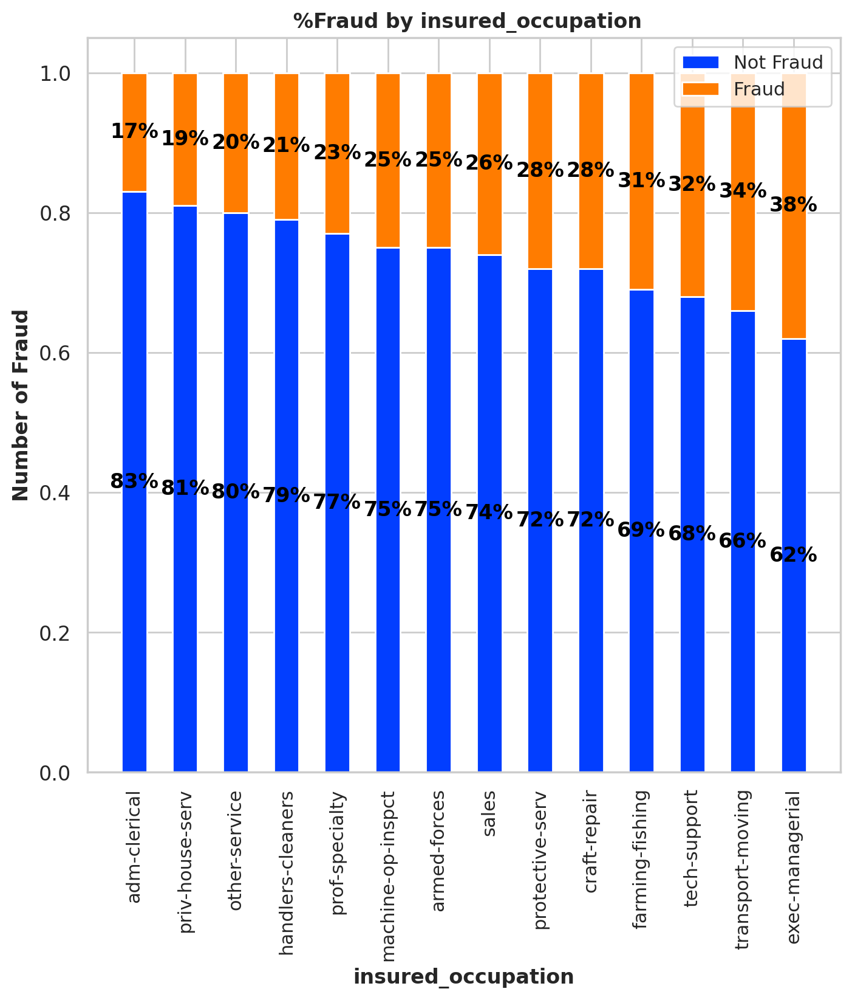

In [ ]:
create_stacked_bar_percent(df_train,"insured_occupation")

Bedasarkan dari data dapat terlihat bahwa insured occputaion farming-finishing, tech-support, transport-support dan exec-managerial memiliki chance untuk melakukan fradu sebesar 30% oleh karena itu utuk pengajuan klaim bedasarkan kategori insured occputaion farming-finishing, tech-support, transport-support dan exec-managerial harus diperhatikan secara lebih

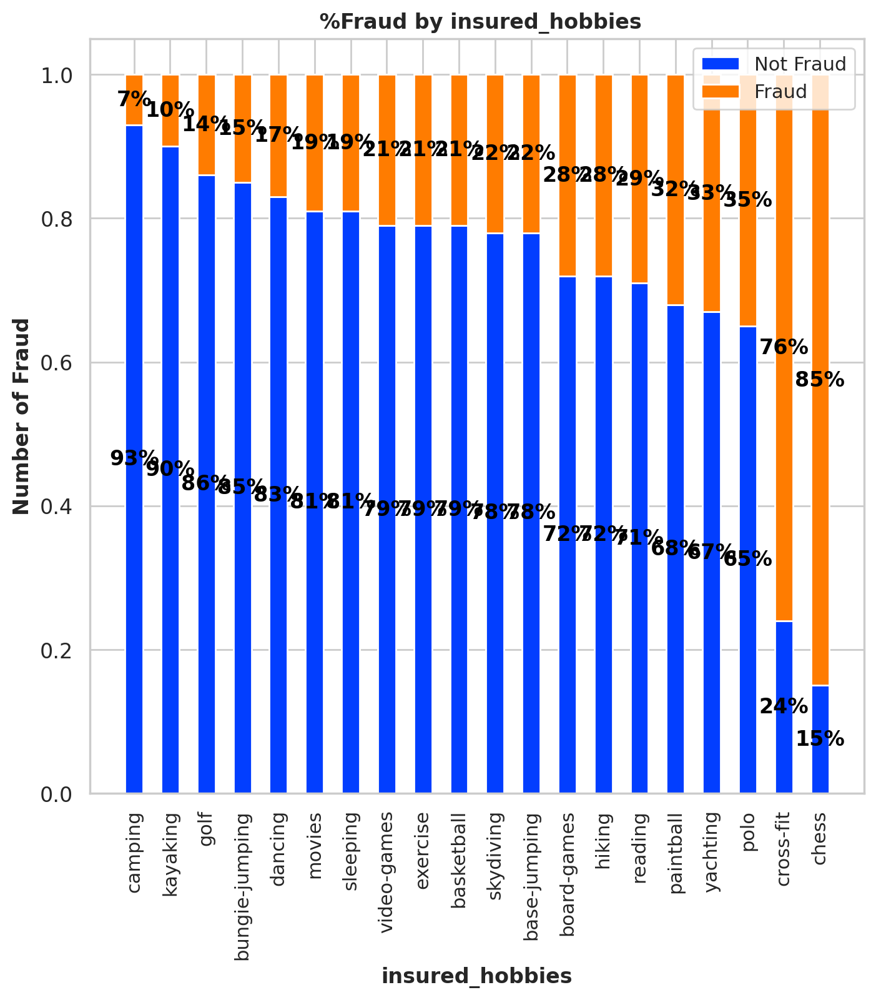

In [ ]:
create_stacked_bar_percent(df_train,"insured_hobbies")

Bedasarkan dari data dapat terlihat bahwa orang yang memiliki hobby cross-fit dan chess memiliki percentase fraud yang sangat tinggi sebesar 76% dan 85%


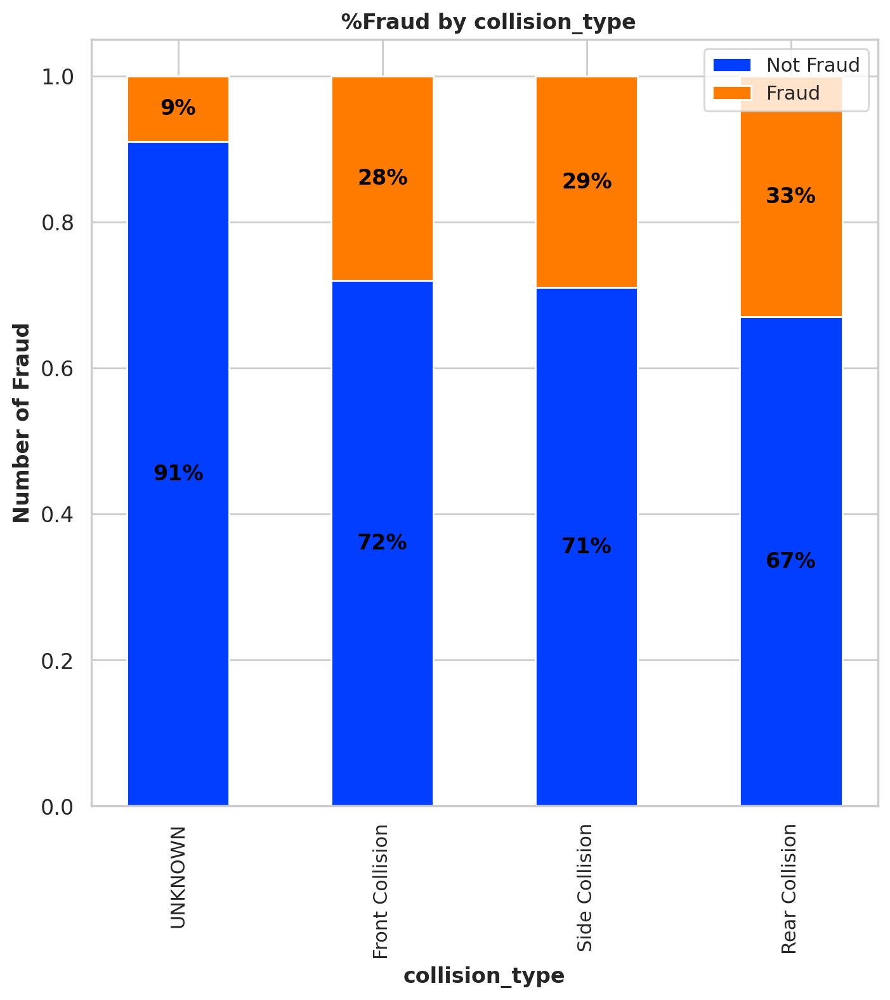

In [ ]:
create_stacked_bar_percent(df_train,"collision_type")

Untuk jenis kecelakan yang tidak diketahui memiliki persentasi fraud terendah sedangkan dengan jenis kecelakaan rear collision memiliki persentase fraud sebesar 33%, untuk front dan side collision memiliki perbedaan yang sedikit sehingga dapat di kelompokkan menjadi jadi dan selanjutnya akan di ranking.

0 = Unknown

1 = Front dan Side Collision

2 = Read Collision

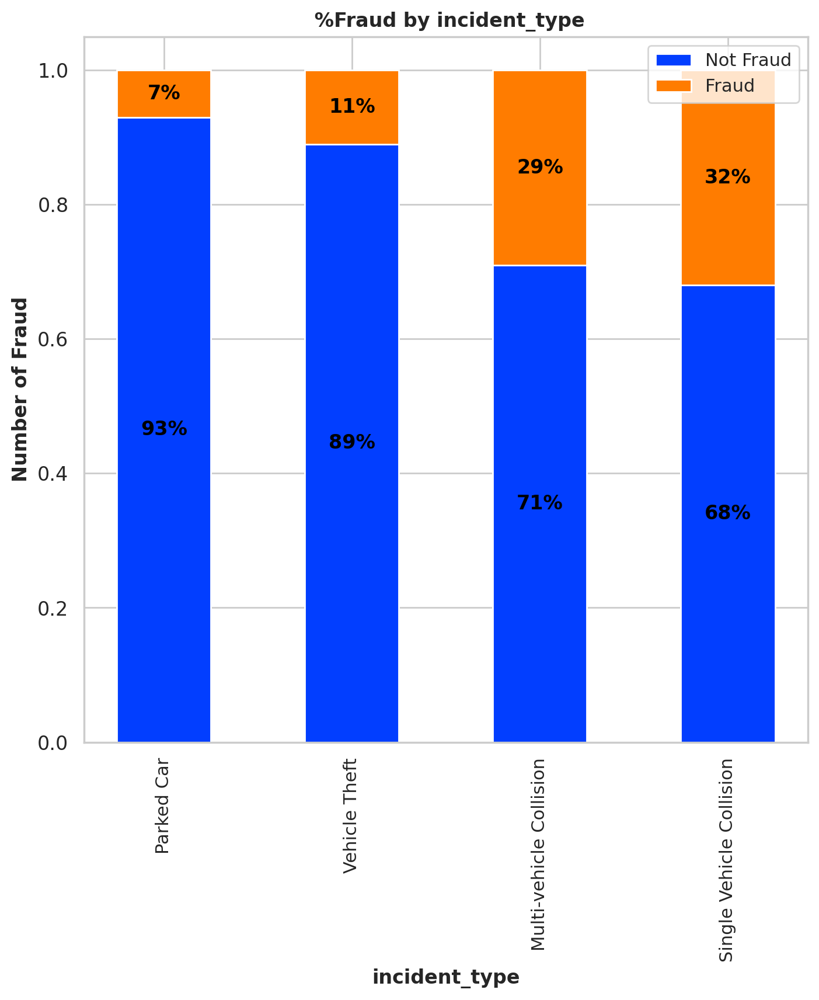

In [ ]:
create_stacked_bar_percent(df_train,"incident_type")

berdasarkan dari jenis insiden, Multi dan Single Vehicle Collision memiliki persentase yag besar untuk terjadinya fraud

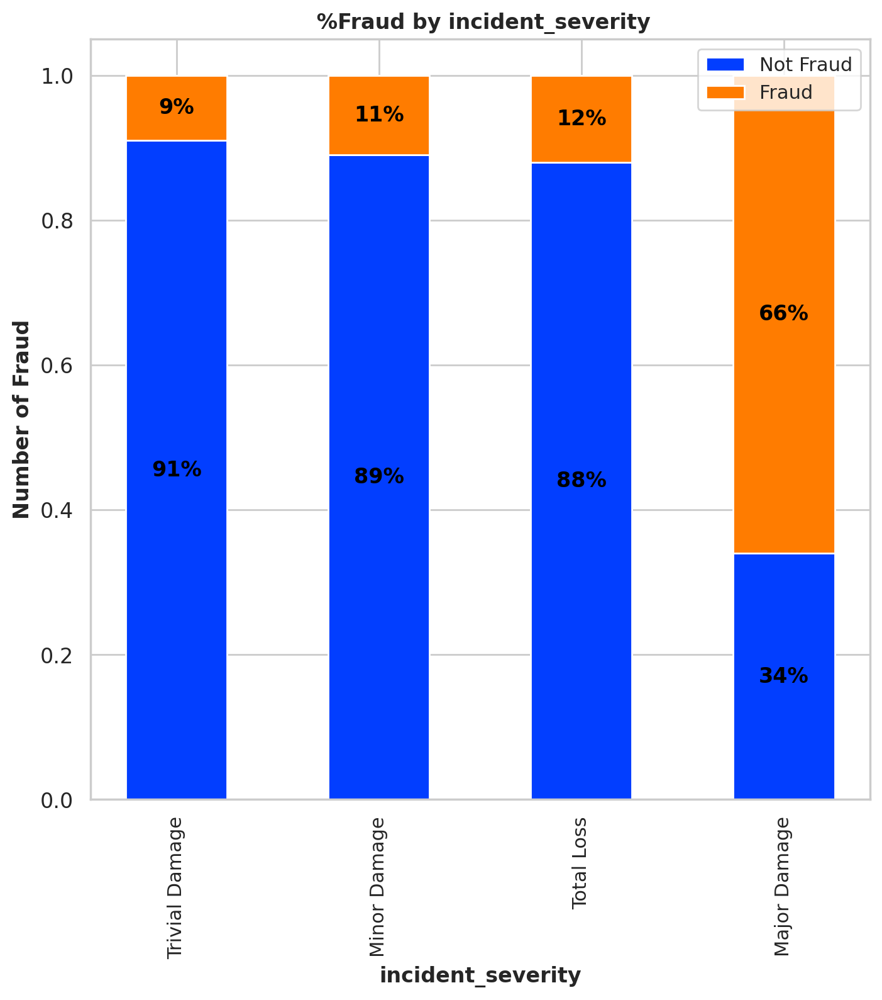

In [ ]:
create_stacked_bar_percent(df_train,"incident_severity")

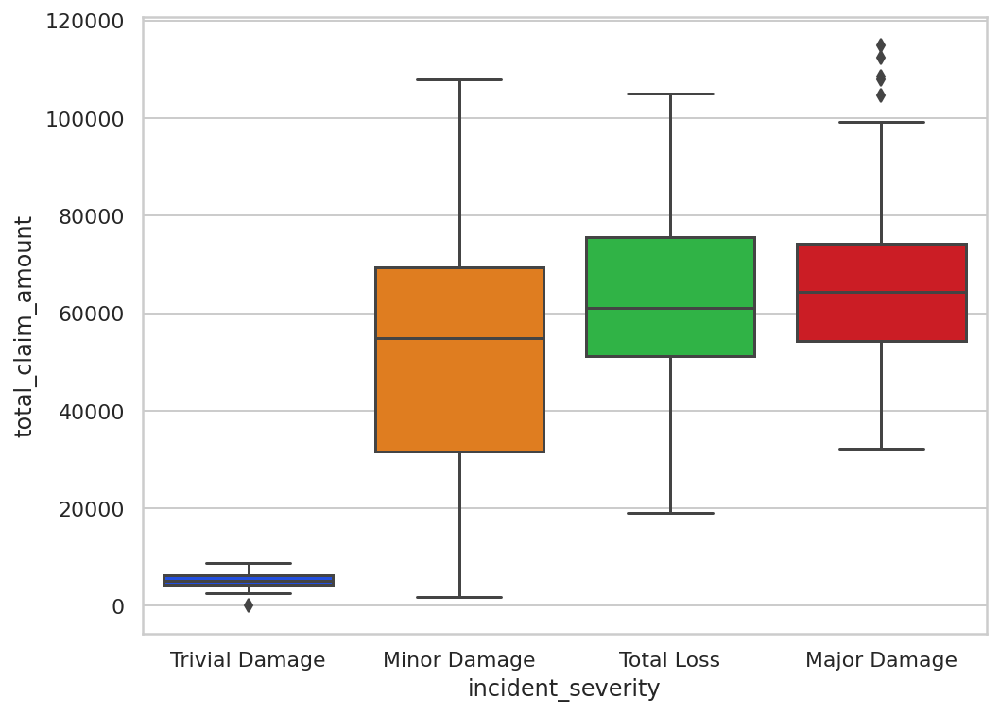

In [ ]:
plt.figure(figsize=(8,6))
sns.boxplot(data=df_train,x="incident_severity",y="total_claim_amount",order=["Trivial Damage","Minor Damage","Total Loss","Major Damage"])

berdasarkan tingkat kerusakannya, major damage memiliki persentase terbesar terjadinya fraud, hal ini memberikan penjelasan bahwa biasanya mereka yg melakukan fraud akan melaporkan kondisi kerusakan yg lebih besar dari pada yg terjadi sebenarnya

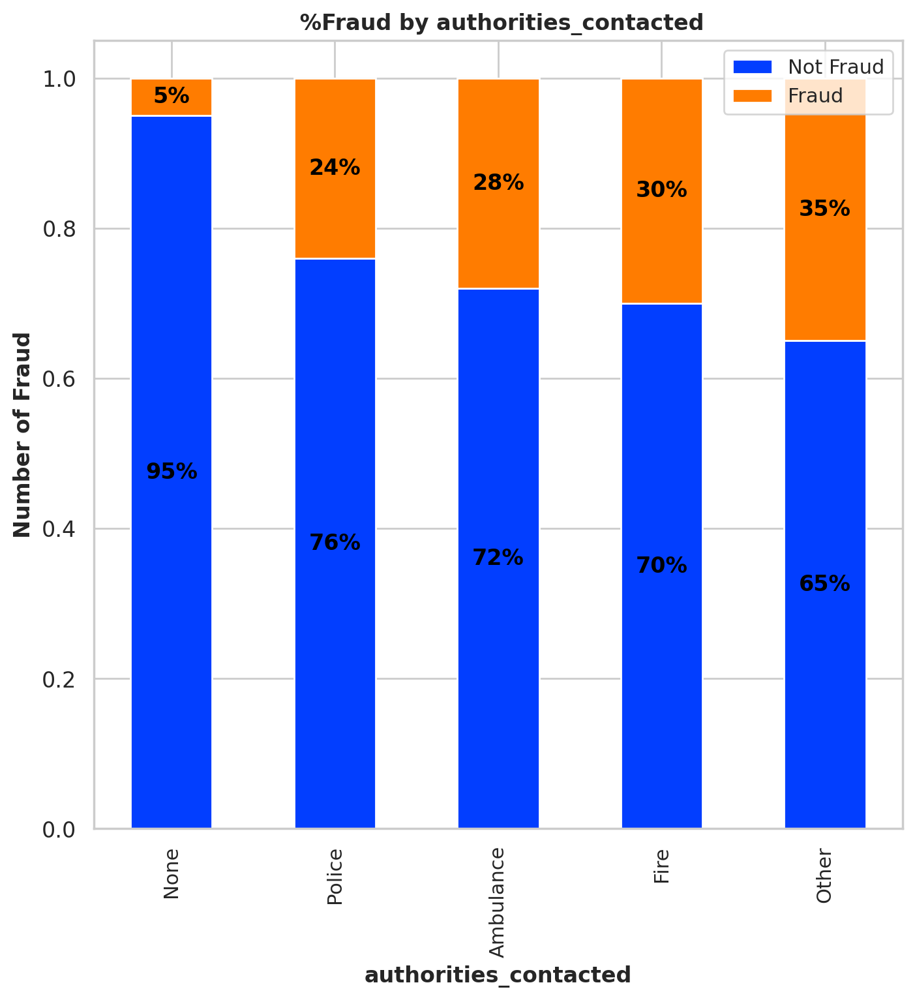

In [ ]:
create_stacked_bar_percent(df_train,"authorities_contacted")

Ketika tidak terdapat laporan dengan pihak berwajib persentase fraud sangat kecil, sedangkan jenis laporan dengan kontak fire memiliki persentase yang tinggi. untuk other cukup bias karena Other tidak memberikan informasi yg cukup dalam mengenainya

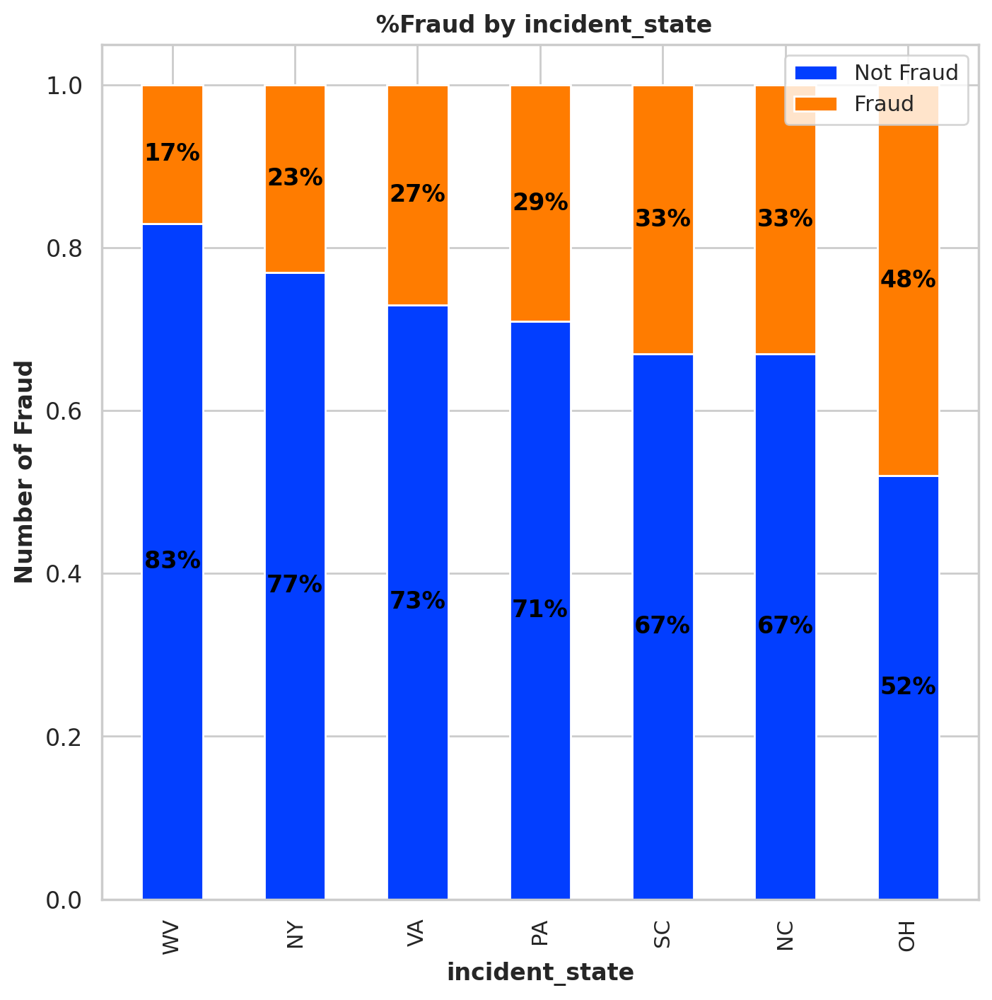

In [ ]:
create_stacked_bar_percent(df_train,"incident_state")

Negara yang sering fraud adalah OH (OHIO) dengan persentase 48%.

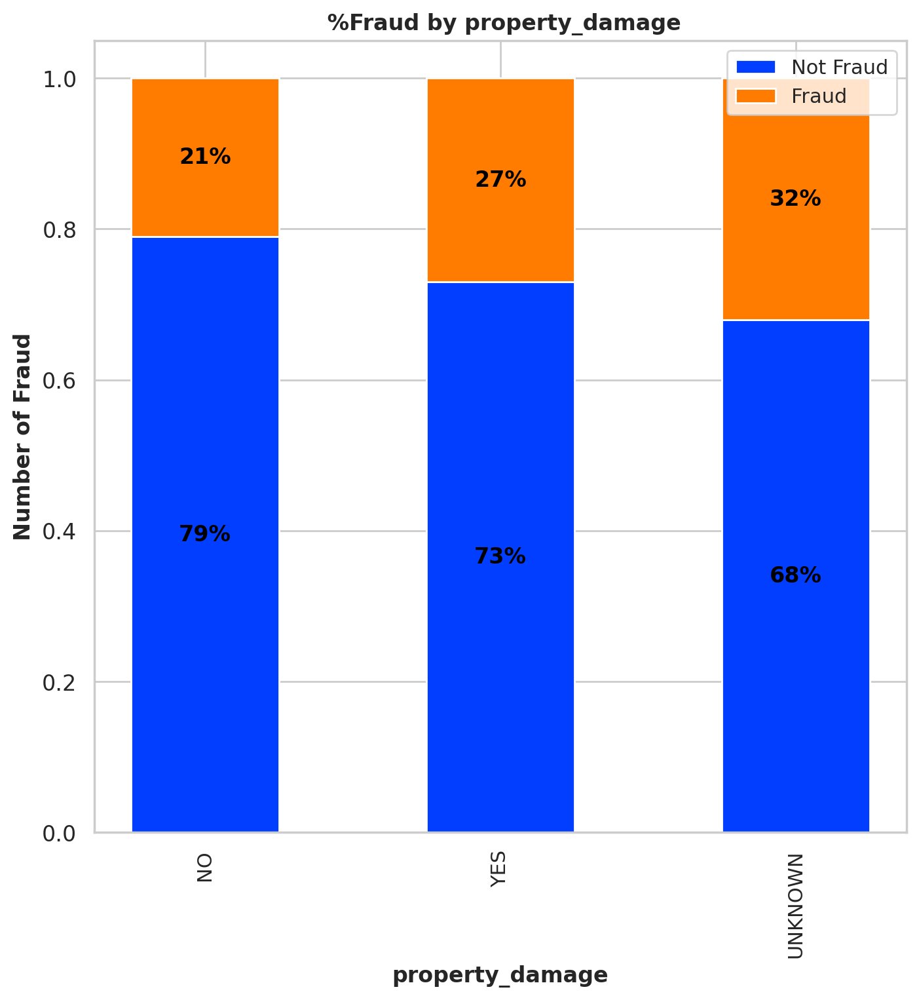

In [ ]:
create_stacked_bar_percent(df_train,"property_damage")

properti damage yang tidak diketahui memiliki persentase fraud yang besar dibandingkan dengan No dan Yes

# 4.Model machine learning

In [ ]:
ord_policy_csl = {'500/1000':1,
                 '100/300':2,
                  '250/500':3}

properti_damage = {"NO":0,
                   "YES":1,
                   "UNKNOWN":2}

incident_type = {"Parked Car":0,
                 "Vehicle Theft":1,
                 "Multi-vehicle Collision":2,
                 "Single Vehicle Collision":3}

collision_type = {"UNKNOWN":0,
                  "Front Collision":1,
                  "Side Collision":1,
                  "Rear Collision":2}

incident_severity = {"Trivial Damage":1,
                     "Minor Damage":2,
                     "Total Loss":3,
                     "Major Damage":4}

df_train["policy_csl"] = df_train["policy_csl"].map(ord_policy_csl)
df_train['incident_severity'] = df_train['incident_severity'].map(incident_severity)
df_train["property_damage"] = df_train["property_damage"].map(properti_damage)
df_train["incident_type"] = df_train["incident_type"].map(incident_type)
df_train["collision_type"] = df_train["collision_type"].map(collision_type)


df_test["policy_csl"] = df_test["policy_csl"].map(ord_policy_csl)
df_test['incident_severity'] = df_test['incident_severity'].map(incident_severity)
df_test["property_damage"] = df_test["property_damage"].map(properti_damage)
df_test["incident_type"] = df_test["incident_type"].map(incident_type)
df_test["collision_type"] = df_test["collision_type"].map(collision_type)

df.new_nom_col =["insured_occupation","insured_hobbies","authorities_contacted","incident_state"]

dummies = pd.DataFrame()
for x in df.new_nom_col:
  dummies = pd.get_dummies(df_train[x],prefix=x+"_")
  df_train = pd.concat([df_train,dummies],axis=1)

dummies_1 = pd.DataFrame()
for x in df.new_nom_col:
  dummies_1 = pd.get_dummies(df_test[x],prefix=x+"_")
  df_test = pd.concat([df_test,dummies_1],axis=1)

df_train = df_train.drop(df.new_nom_col,axis=1)
df_test = df_test.drop(df.new_nom_col,axis=1)


In [ ]:
df_train = df_train.drop(["insured_occupation__adm-clerical","insured_hobbies__camping","authorities_contacted__None","incident_state__WV"],axis=1)
df_test = df_test.drop(["insured_occupation__adm-clerical","insured_hobbies__camping","authorities_contacted__None","incident_state__WV"],axis=1)

In [ ]:
df_train.head()

,policy_csl,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_type,collision_type,incident_severity,number_of_vehicles_involved,property_damage,...,authorities_contacted__Ambulance,authorities_contacted__Fire,authorities_contacted__Other,authorities_contacted__Police,incident_state__NC,incident_state__NY,incident_state__OH,incident_state__PA,incident_state__SC,incident_state__VA
policy_number,,,,,,,,,,,,,,,,,,,,,
521585,3,1406.91,0,53300,0,3,1,4,1,1,...,0,0,0,1,0,0,0,0,1,0
342868,3,1197.22,5000000,0,0,1,0,2,1,2,...,0,0,0,1,0,0,0,0,0,1
227811,3,1415.74,6000000,48900,-62400,3,1,4,1,2,...,0,0,0,1,0,0,1,0,0,0
104594,3,1351.10,0,0,0,2,2,4,3,0,...,0,1,0,0,0,0,0,0,1,0
413978,3,1333.35,0,0,-77000,2,1,2,3,2,...,0,0,0,1,0,1,0,0,0,0


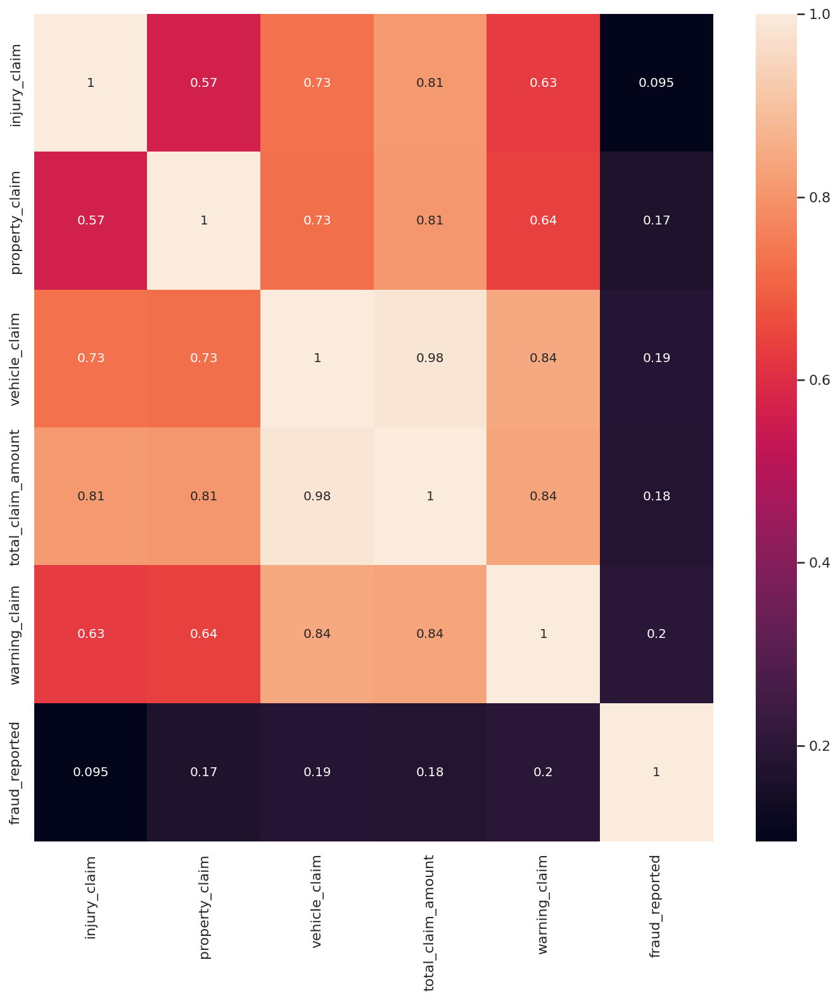

In [ ]:
plt.figure(figsize=(12,12))
sns.heatmap(df_train[["injury_claim","property_claim","vehicle_claim","total_claim_amount","warning_claim","fraud_reported"]].corr(),annot=True,fmt='.2g')

terjadinya kolinearitas tinggi pada vehicle dan total amount, maka dibuang total amount, karena total amount adalah jumlah dari injury_claim,property_claim dan vehicle_claim

In [ ]:
df_train = df_train.drop("total_claim_amount",axis=1)
df_test = df_test.drop("total_claim_amount",axis=1)

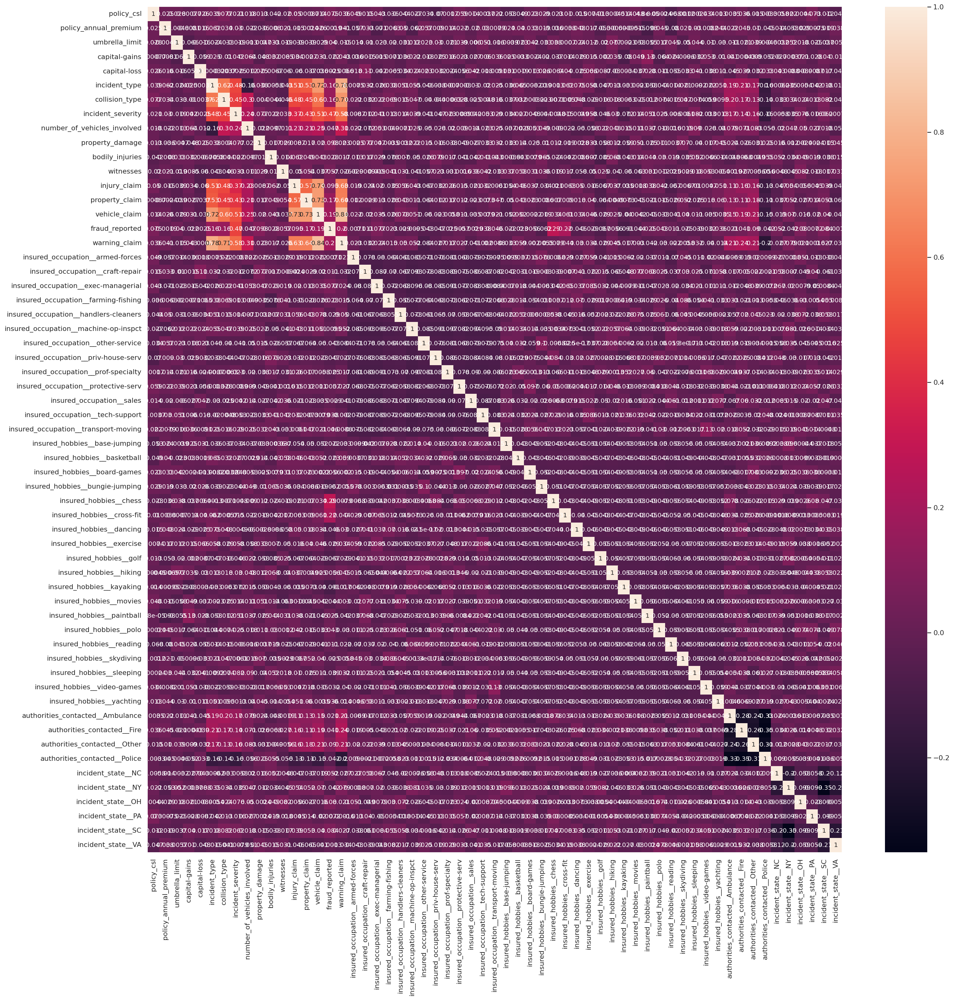

In [ ]:
plt.figure(figsize=(25,25))
sns.heatmap(df_train.corr(),annot=True,fmt='.2g')

## Logistic Regression

In [ ]:
X_train = df_train.drop("fraud_reported",axis=1).copy()
y_train = df_train["fraud_reported"].copy()

X_test = df_test.drop("fraud_reported",axis=1).copy()
y_test = df_test["fraud_reported"].copy()

In [ ]:
logreg = LogisticRegression()

random_grid = {"penalty":["elasticnet","l2"],
       "fit_intercept":[True,False],
       "C": [0.25, 0.5, 0.75, 1.0]}

scoreFunction = {"f1": "f1"}
random_search = RandomizedSearchCV(logreg,
                                   param_distributions = random_grid,
                                   n_iter = 100,
                                   scoring = scoreFunction,               
                                   refit = "f1", 
                                   return_train_score = False,
                                   random_state = 0,
                                   verbose = 2,
                                   cv = 3,
                                   n_jobs = -1) 

random_search.fit(X_train, y_train)

print('Finished RandomizedSearchCV')

Fitting 3 folds for each of 16 candidates, totalling 48 fits
Finished RandomizedSearchCV


              precision    recall  f1-score   support

           0       0.84      0.93      0.88       561
           1       0.72      0.53      0.61       204

    accuracy                           0.82       765
   macro avg       0.78      0.73      0.75       765
weighted avg       0.81      0.82      0.81       765



Text(30.5, 0.5, 'Real')

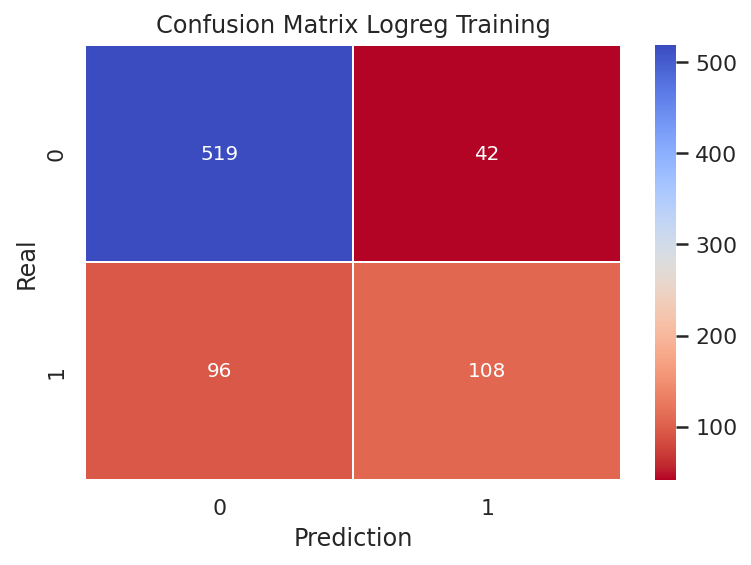

In [ ]:
cnf_matrix = metrics.confusion_matrix(y_train, random_search.best_estimator_.predict(X_train))
print(metrics.classification_report(y_train,random_search.best_estimator_.predict(X_train)))
sns.heatmap(cnf_matrix,cmap='coolwarm_r',annot=True,linewidth=0.5,fmt='d')
plt.title('Confusion Matrix Logreg Training')

plt.xlabel('Prediction')
plt.ylabel('Real')

In [ ]:
false_positive_rate, true_positive_rate, threshold = roc_curve(y_train,random_search.best_estimator_.predict_proba(X_train)[:,1])
roc_auc_value = roc_auc_score(y_train, random_search.best_estimator_.predict_proba(X_train)[:,1]).round(4)
gini_value = ((2*roc_auc_value)-1).round(4)

print('AUC : ', round(roc_auc_value*100, 2), '%')
print('Gini : ', round(gini_value*100, 2), '%')

AUC :  59.84 %
Gini :  19.68 %


              precision    recall  f1-score   support

           0       0.82      0.98      0.89       192
           1       0.20      0.02      0.04        43

    accuracy                           0.80       235
   macro avg       0.51      0.50      0.47       235
weighted avg       0.70      0.80      0.74       235



Text(30.5, 0.5, 'Real')

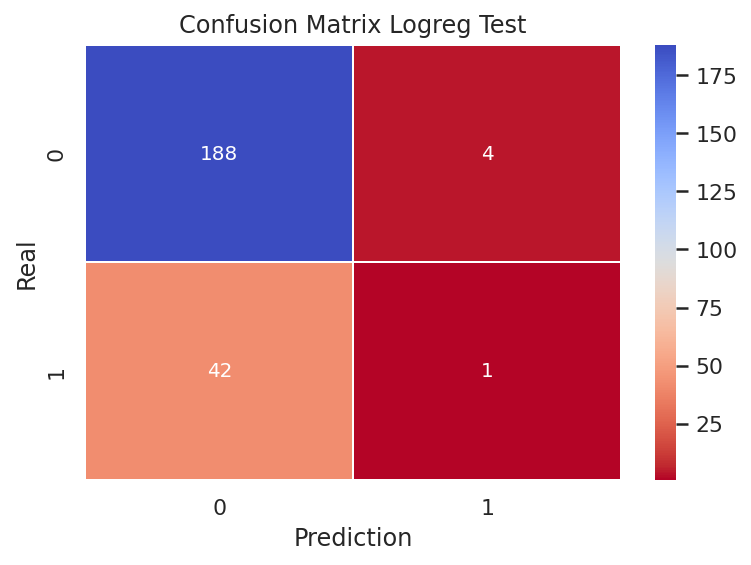

In [ ]:
cnf_matrix = metrics.confusion_matrix(y_test, random_search.best_estimator_.predict(X_test))
print(metrics.classification_report(y_test,random_search.best_estimator_.predict(X_test)))
sns.heatmap(cnf_matrix,cmap='coolwarm_r',annot=True,linewidth=0.5,fmt='d')
plt.title('Confusion Matrix Logreg Test')
plt.xlabel('Prediction')
plt.ylabel('Real')

In [ ]:
false_positive_rate, true_positive_rate, threshold = roc_curve(y_test,random_search.best_estimator_.predict_proba(X_test)[:,1])
roc_auc_value = roc_auc_score(y_test, random_search.best_estimator_.predict_proba(X_test)[:,1]).round(4)
gini_value = ((2*roc_auc_value)-1).round(4)

print('AUC LogRec: ', round(roc_auc_value*100, 2), '%')
print('Gini LogRec: ', round(gini_value*100, 2), '%')

AUC LogRec:  58.86 %
Gini LogRec:  17.72 %


## KNN

In [ ]:
knn = KNeighborsClassifier()

random_grid = {"n_neighbors": [2,3,4,5],
       "p":[1,2]}

scoreFunction = {"f1": "f1"}
random_search = RandomizedSearchCV(knn,
                                   param_distributions = random_grid,
                                   n_iter = 100,
                                   scoring = scoreFunction,               
                                   refit = "f1", 
                                   return_train_score = False,
                                   random_state = 0,
                                   verbose = 2,
                                   cv = 3,
                                   n_jobs = -1) 

random_search.fit(X_train, y_train)

print('Finished')

Fitting 3 folds for each of 8 candidates, totalling 24 fits
Finished


              precision    recall  f1-score   support

           0       0.84      0.93      0.88       561
           1       0.72      0.53      0.61       204

    accuracy                           0.82       765
   macro avg       0.78      0.73      0.75       765
weighted avg       0.81      0.82      0.81       765



Text(30.5, 0.5, 'Real')

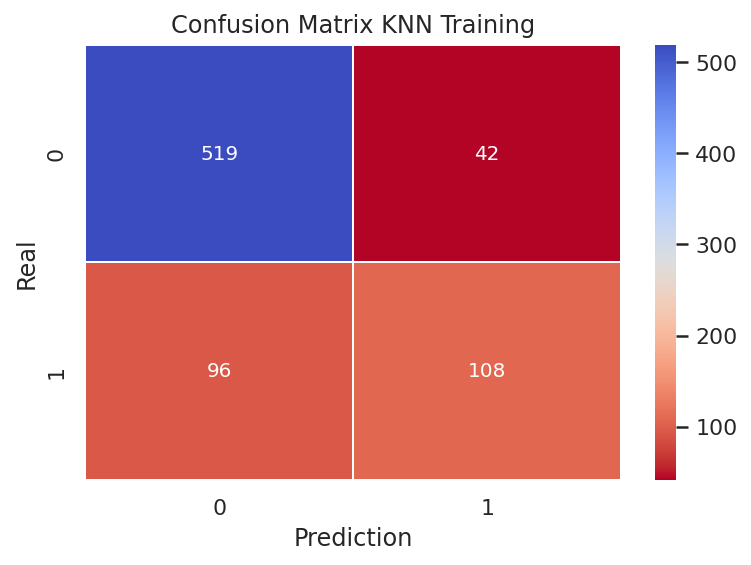

In [ ]:
cnf_matrix = metrics.confusion_matrix(y_train, random_search.best_estimator_.predict(X_train))
print(metrics.classification_report(y_train,random_search.best_estimator_.predict(X_train)))
sns.heatmap(cnf_matrix,cmap='coolwarm_r',annot=True,linewidth=0.5,fmt='d')
plt.title('Confusion Matrix KNN Training')
plt.xlabel('Prediction')
plt.ylabel('Real')

In [ ]:
false_positive_rate, true_positive_rate, threshold = roc_curve(y_test,random_search.best_estimator_.predict_proba(X_test)[:,1])
roc_auc_value = roc_auc_score(y_test, random_search.best_estimator_.predict_proba(X_test)[:,1]).round(4)
gini_value = ((2*roc_auc_value)-1).round(4)

print('AUC KNN: ', round(roc_auc_value*100, 2), '%')
print('Gini KNN: ', round(gini_value*100, 2), '%')

AUC KNN:  58.86 %
Gini KNN:  17.72 %


## Random Forest

In [ ]:
rf = RandomForestClassifier()

random_grid = {'n_estimators': [10, 50, 100, 1000],
               'max_features': ["sqrt", "log2"],
               'max_depth': [3,5,10, None],
               'criterion':['gini','entropy']}

scoreFunction = {"f1": "f1"}

random_search = RandomizedSearchCV(rf,
                                   param_distributions = random_grid,
                                   n_iter = 100,
                                   scoring = scoreFunction,               
                                   refit = "f1", 
                                   return_train_score = False,
                                   random_state = 0,
                                   verbose = 2,
                                   cv = 3,
                                   n_jobs = -1) 

random_search.fit(X_train, y_train)

print('Finished')

Fitting 3 folds for each of 64 candidates, totalling 192 fits
Finished


              precision    recall  f1-score   support

           0       1.00      1.00      1.00       561
           1       1.00      1.00      1.00       204

    accuracy                           1.00       765
   macro avg       1.00      1.00      1.00       765
weighted avg       1.00      1.00      1.00       765



Text(30.5, 0.5, 'Real')

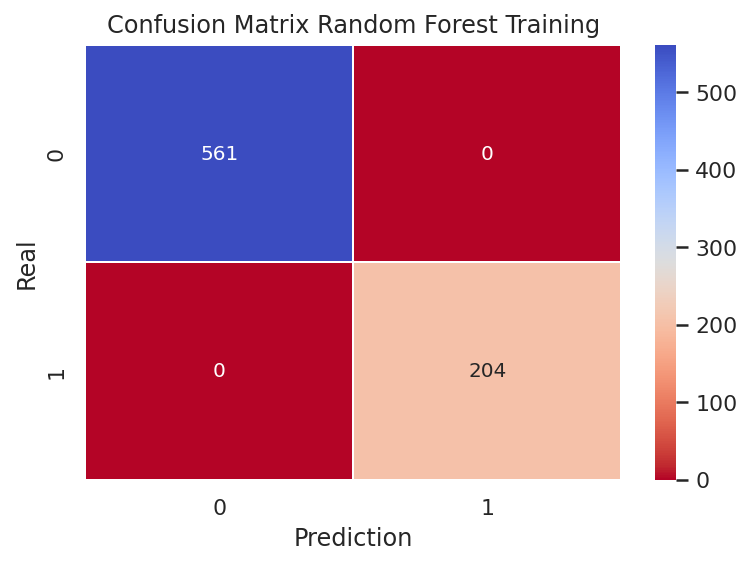

In [ ]:
cnf_matrix = metrics.confusion_matrix(y_train, random_search.best_estimator_.predict(X_train))
print(metrics.classification_report(y_train,random_search.best_estimator_.predict(X_train)))
sns.heatmap(cnf_matrix,cmap='coolwarm_r',annot=True,linewidth=0.5,fmt='d')
plt.title('Confusion Matrix Random Forest Training')
plt.xlabel('Prediction')
plt.ylabel('Real')

In [ ]:
false_positive_rate, true_positive_rate, threshold = roc_curve(y_train,random_search.best_estimator_.predict_proba(X_train)[:,1])
roc_auc_value = roc_auc_score(y_train, random_search.best_estimator_.predict_proba(X_train)[:,1]).round(4)
gini_value = ((2*roc_auc_value)-1).round(4)

print('AUC RandomForest: ', round(roc_auc_value*100, 2), '%')
print('Gini RandomForest: ', round(gini_value*100, 2), '%')

AUC RandomForest:  100.0 %
Gini RandomForest:  100.0 %


              precision    recall  f1-score   support

           0       0.91      0.86      0.88       192
           1       0.50      0.63      0.56        43

    accuracy                           0.82       235
   macro avg       0.71      0.74      0.72       235
weighted avg       0.84      0.82      0.82       235



Text(30.5, 0.5, 'Real')

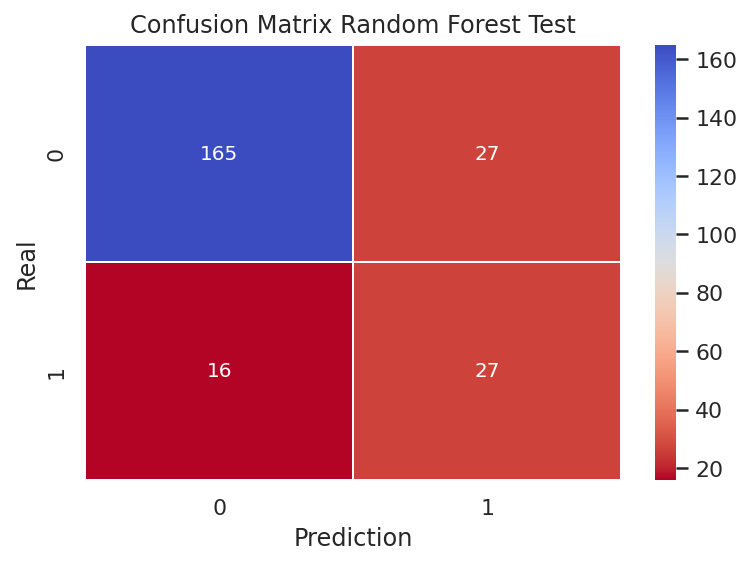

In [ ]:
cnf_matrix = metrics.confusion_matrix(y_test, random_search.best_estimator_.predict(X_test))
print(metrics.classification_report(y_test,random_search.best_estimator_.predict(X_test)))
sns.heatmap(cnf_matrix,cmap='coolwarm_r',annot=True,linewidth=0.5,fmt='d')
plt.title('Confusion Matrix Random Forest Test')
plt.xlabel('Prediction')
plt.ylabel('Real')

In [ ]:
false_positive_rate, true_positive_rate, threshold = roc_curve(y_test,random_search.best_estimator_.predict_proba(X_test)[:,1])
roc_auc_value = roc_auc_score(y_test, random_search.best_estimator_.predict_proba(X_test)[:,1]).round(4)
gini_value = ((2*roc_auc_value)-1).round(4)

print('AUC RandomForest: ', round(roc_auc_value*100, 2), '%')
print('Gini RandomForest: ', round(gini_value*100, 2), '%')

AUC RandomForest:  79.36 %
Gini RandomForest:  58.72 %


## XGBoost

In [ ]:
xgb = XGBClassifier()


random_grid = {'n_estimators': [10, 50, 100],
               "learning_rate": [0.1, 0.05, 0.01],
               'max_depth': [3,5,10],
               "grow_policy": ["depthwise", "lossguide"]}

scoreFunction = {"f1": "f1"}

random_search = RandomizedSearchCV(xgb,
                                   param_distributions = random_grid,
                                   n_iter = 100,
                                   scoring = scoreFunction,               
                                   refit = "f1", 
                                   return_train_score = False,
                                   random_state = 0,
                                   verbose = 2,
                                   cv = 3,
                                   n_jobs = -1) 
random_search.fit(X_train, y_train)

print('Finished ')

Fitting 3 folds for each of 54 candidates, totalling 162 fits
Finished 


              precision    recall  f1-score   support

           0       0.95      0.88      0.91       561
           1       0.73      0.87      0.79       204

    accuracy                           0.88       765
   macro avg       0.84      0.88      0.85       765
weighted avg       0.89      0.88      0.88       765



Text(30.5, 0.5, 'Real')

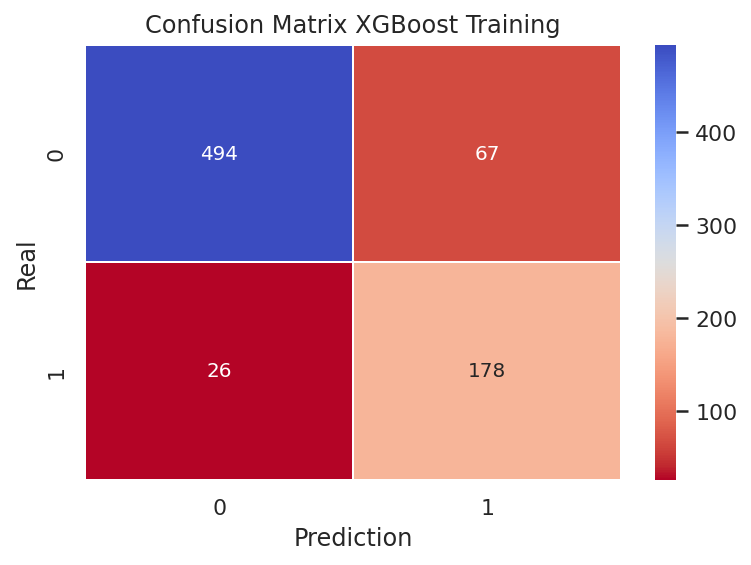

In [ ]:
cnf_matrix = metrics.confusion_matrix(y_train, random_search.best_estimator_.predict(X_train))
print(metrics.classification_report(y_train,random_search.best_estimator_.predict(X_train)))
sns.heatmap(cnf_matrix,cmap='coolwarm_r',annot=True,linewidth=0.5,fmt='d')
plt.title('Confusion Matrix XGBoost Training')
plt.xlabel('Prediction')
plt.ylabel('Real')

In [ ]:
false_positive_rate, true_positive_rate, threshold = roc_curve(y_train,random_search.best_estimator_.predict_proba(X_train)[:,1])
roc_auc_value = roc_auc_score(y_train, random_search.best_estimator_.predict_proba(X_train)[:,1]).round(4)
gini_value = ((2*roc_auc_value)-1).round(4)

print('AUC XGBOOST: ', round(roc_auc_value*100, 2), '%')
print('Gini XGBOOST: ', round(gini_value*100, 2), '%')

AUC XGBOOST:  91.7 %
Gini XGBOOST:  83.4 %


              precision    recall  f1-score   support

           0       0.93      0.82      0.87       192
           1       0.48      0.74      0.58        43

    accuracy                           0.80       235
   macro avg       0.71      0.78      0.73       235
weighted avg       0.85      0.80      0.82       235



Text(30.5, 0.5, 'Real')

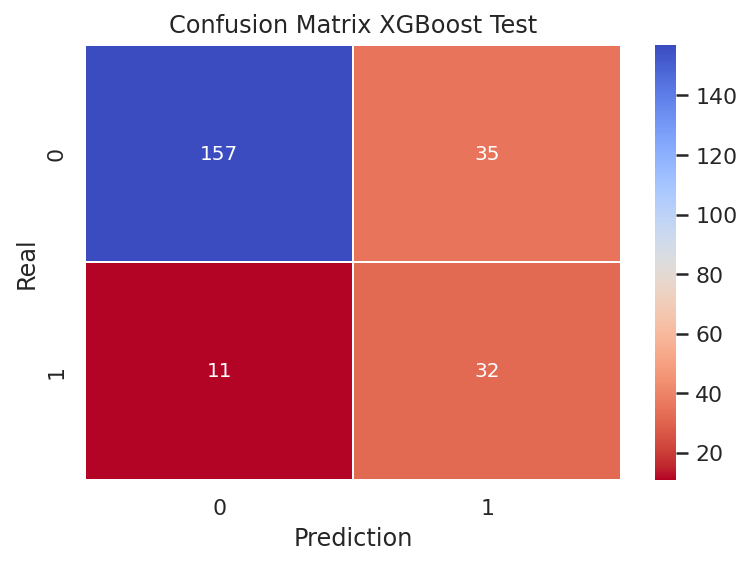

In [ ]:
cnf_matrix = metrics.confusion_matrix(y_test, random_search.best_estimator_.predict(X_test))
print(metrics.classification_report(y_test,random_search.best_estimator_.predict(X_test)))
sns.heatmap(cnf_matrix,cmap='coolwarm_r',annot=True,linewidth=0.5,fmt='d')
plt.title('Confusion Matrix XGBoost Test')
plt.xlabel('Prediction')
plt.ylabel('Real')

In [ ]:
false_positive_rate, true_positive_rate, threshold = roc_curve(y_test,random_search.best_estimator_.predict_proba(X_test)[:,1])
roc_auc_value = roc_auc_score(y_test, random_search.best_estimator_.predict_proba(X_test)[:,1]).round(4)
gini_value = ((2*roc_auc_value)-1).round(4)

print('AUC XGBOOST: ', round(roc_auc_value*100, 2), '%')
print('Gini XGBOOST: ', round(gini_value*100, 2), '%')

AUC XGBOOST:  82.76 %
Gini XGBOOST:  65.52 %


hasil evaluasi model terbaik adalah  XGBOOST

In [ ]:
gmean = np.sqrt(true_positive_rate * (1 - false_positive_rate))

index = np.argmax(gmean)
thresholdOpt = round(threshold[index], ndigits = 4)
gmeanOpt = round(gmean[index], ndigits = 4)
fprOpt = round(false_positive_rate[index], ndigits = 4)
tprOpt = round(true_positive_rate[index], ndigits = 4)
print('Best Threshold: {} with G-Mean: {}'.format(thresholdOpt, gmeanOpt))
print('FPR: {}, TPR: {}'.format(fprOpt, tprOpt))

Best Threshold: 0.4587000012397766 with G-Mean: 0.8132
FPR: 0.1875, TPR: 0.814


              precision    recall  f1-score   support

           0       0.95      0.81      0.87       192
           1       0.49      0.79      0.60        43

    accuracy                           0.81       235
   macro avg       0.72      0.80      0.74       235
weighted avg       0.86      0.81      0.82       235



Text(30.5, 0.5, 'Real')

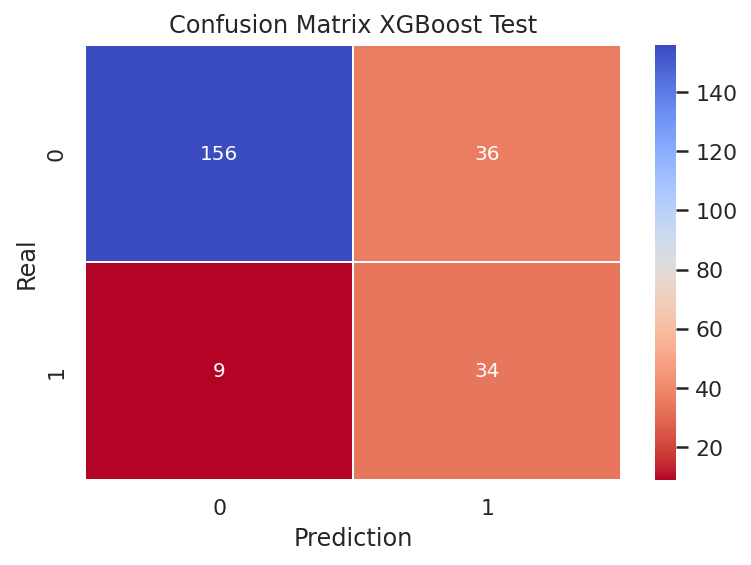

In [ ]:
thrshold = 0.4587000012397766
y_pred_thr = np.where(random_search.predict_proba(X_test)[:,1]>=thrshold,1,0)
# predict test
cnf_matrix = metrics.confusion_matrix(y_test, y_pred_thr)
print(metrics.classification_report(y_test,y_pred_thr))
sns.heatmap(cnf_matrix,cmap='coolwarm_r',annot=True,linewidth=0.5,fmt='d')
plt.title('Confusion Matrix XGBoost Test')
plt.xlabel('Prediction')
plt.ylabel('Real')

# 5.Interpretasikan model terbaik (berdasarkan f1-score)

In [ ]:
feature_importance = pd.DataFrame({
    'Features':X_train.columns,
    'Importance':random_search.best_estimator_.feature_importances_}).sort_values('Importance', ascending=False)

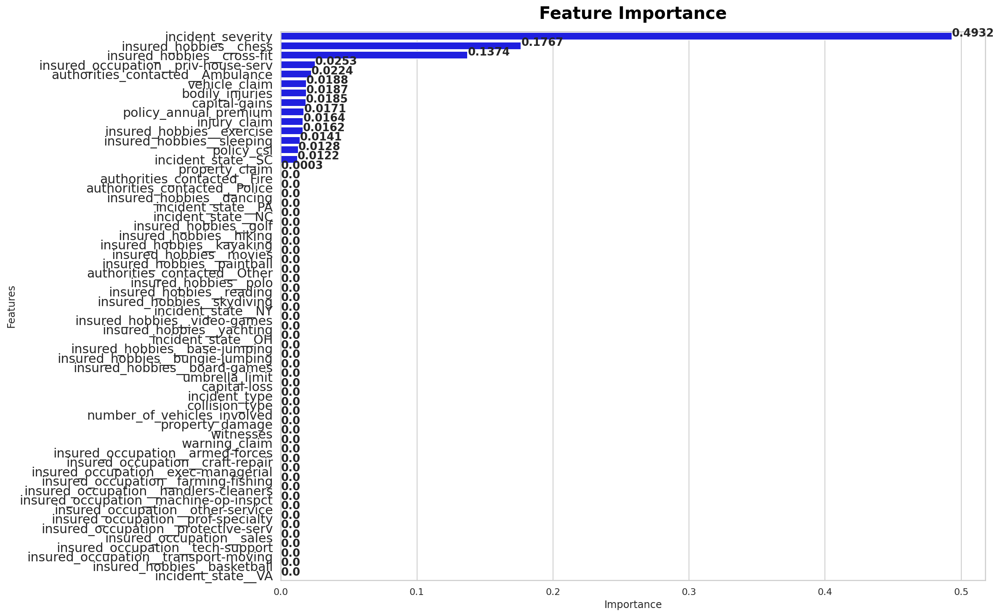

In [ ]:
plt.figure(figsize=(15, 12))
sns.barplot(data=feature_importance, x='Importance', y='Features', color='blue')

def addlabels(x,y):
    for i in range(len(x)):
        plt.text(x[i],i, round(x[i], 4), fontsize=13, fontweight='bold')

x = list(feature_importance['Importance'])
y = list(feature_importance['Features'])

plt.title('Feature Importance', fontsize=20, color='black', pad=15, fontweight='bold')
plt.yticks(fontsize=15)
addlabels(x, y)
plt.show()

Berdasarkan data diatas dapat dilakukan pengurangan prediktor dari kolom yg tidak memeiliki pengaruh terhadap hasil dari model XGBOOst.

In [ ]:
feature_importance[feature_importance["Importance"]>0]["Features"].values

array(['incident_severity', 'insured_hobbies__chess',
       'insured_hobbies__cross-fit',
       'insured_occupation__priv-house-serv',
       'authorities_contacted__Ambulance', 'vehicle_claim',
       'bodily_injuries', 'capital-gains', 'policy_annual_premium',
       'injury_claim', 'insured_hobbies__exercise',
       'insured_hobbies__sleeping', 'policy_csl', 'incident_state__SC',
       'property_claim'], dtype=object)

In [ ]:
X_train_new = X_train[['incident_severity', 'insured_hobbies__chess',\
       'insured_hobbies__cross-fit',\
       'insured_occupation__priv-house-serv',\
       'authorities_contacted__Ambulance', 'vehicle_claim',\
       'bodily_injuries', 'capital-gains', 'policy_annual_premium',\
       'injury_claim', 'insured_hobbies__exercise',\
       'insured_hobbies__sleeping', 'policy_csl', 'incident_state__SC',\
       'property_claim']]

X_test_new = X_test[['incident_severity', 'insured_hobbies__chess',\
       'insured_hobbies__cross-fit',\
       'insured_occupation__priv-house-serv',\
       'authorities_contacted__Ambulance', 'vehicle_claim',\
       'bodily_injuries', 'capital-gains', 'policy_annual_premium',\
       'injury_claim', 'insured_hobbies__exercise',\
       'insured_hobbies__sleeping', 'policy_csl', 'incident_state__SC',\
       'property_claim']]

In [ ]:
xgb = XGBClassifier(random_state=42)


random_grid = {'n_estimators': [10, 50, 100],
               "learning_rate": [0.1, 0.05, 0.01],
               'max_depth': [3,5,10],
               "grow_policy": ["depthwise", "lossguide"]}

scoreFunction = {"f1": "f1"}

random_search_new = RandomizedSearchCV(xgb,
                                   param_distributions = random_grid,
                                   n_iter = 100,
                                   scoring = scoreFunction,               
                                   refit = "f1", 
                                   return_train_score = False,
                                   random_state = 42,
                                   verbose = True,
                                   cv = 3,
                                   n_jobs = -1) 

random_search_new.fit(X_train_new, y_train)

print('Finished ')

Fitting 3 folds for each of 54 candidates, totalling 162 fits
Finished 


              precision    recall  f1-score   support

           0       0.95      0.88      0.91       561
           1       0.72      0.88      0.79       204

    accuracy                           0.88       765
   macro avg       0.84      0.88      0.85       765
weighted avg       0.89      0.88      0.88       765



Text(30.5, 0.5, 'Real')

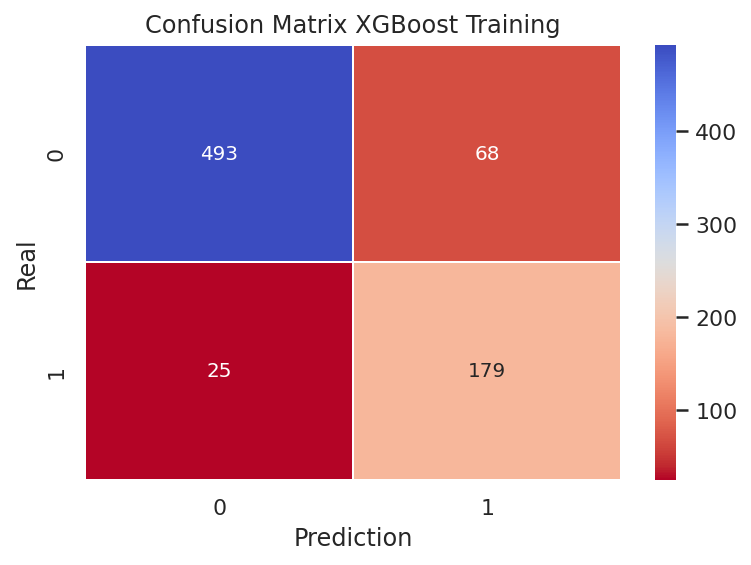

In [ ]:
cnf_matrix = metrics.confusion_matrix(y_train, random_search_new.best_estimator_.predict(X_train_new))
print(metrics.classification_report(y_train,random_search_new.best_estimator_.predict(X_train_new)))
sns.heatmap(cnf_matrix,cmap='coolwarm_r',annot=True,linewidth=0.5,fmt='d')
plt.title('Confusion Matrix XGBoost Training')
plt.xlabel('Prediction')
plt.ylabel('Real')

In [ ]:
false_positive_rate, true_positive_rate, threshold = roc_curve(y_train,random_search_new.best_estimator_.predict_proba(X_train_new)[:,1])
roc_auc_value = roc_auc_score(y_train, random_search_new.best_estimator_.predict_proba(X_train_new)[:,1]).round(4)
gini_value = ((2*roc_auc_value)-1).round(4)

print('AUC XGBOOST: ', round(roc_auc_value*100, 2), '%')
print('Gini XGBOOST: ', round(gini_value*100, 2), '%')

AUC XGBOOST:  91.62 %
Gini XGBOOST:  83.24 %


              precision    recall  f1-score   support

           0       0.93      0.82      0.87       192
           1       0.48      0.74      0.58        43

    accuracy                           0.80       235
   macro avg       0.71      0.78      0.73       235
weighted avg       0.85      0.80      0.82       235



Text(30.5, 0.5, 'Real')

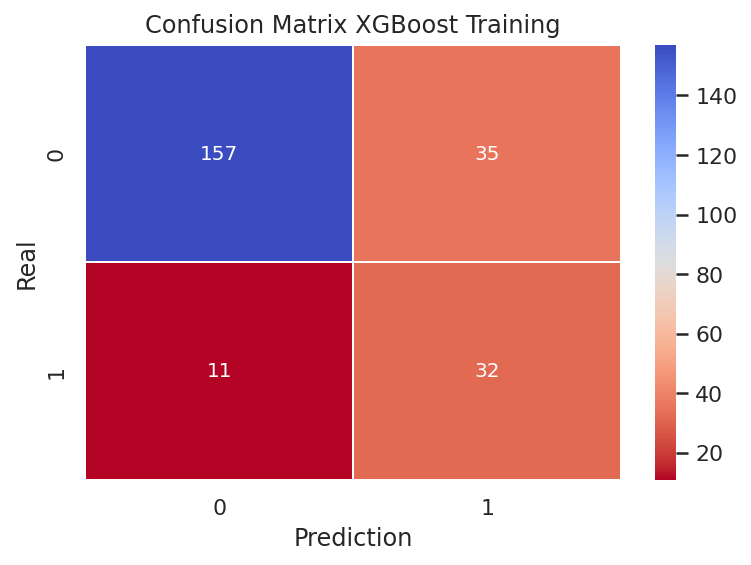

In [ ]:
cnf_matrix = metrics.confusion_matrix(y_test, random_search_new.best_estimator_.predict(X_test_new))
print(metrics.classification_report(y_test,random_search_new.best_estimator_.predict(X_test_new)))
sns.heatmap(cnf_matrix,cmap='coolwarm_r',annot=True,linewidth=0.5,fmt='d')
plt.title('Confusion Matrix XGBoost Training')
plt.xlabel('Prediction')
plt.ylabel('Real')

In [ ]:
false_positive_rate, true_positive_rate, threshold = roc_curve(y_test,random_search_new.best_estimator_.predict_proba(X_test_new)[:,1])
roc_auc_value = roc_auc_score(y_test, random_search_new.best_estimator_.predict_proba(X_test_new)[:,1]).round(4)
gini_value = ((2*roc_auc_value)-1).round(4)

print('AUC XGBOOST: ', round(roc_auc_value*100, 2), '%')
print('Gini XGBOOST: ', round(gini_value*100, 2), '%')

AUC XGBOOST:  82.9 %
Gini XGBOOST:  65.8 %


Setelah dikurangi beberapa prediktor hasil dari model XGBOOST dapat dikatakan lebih baik, oleh karena itu di lakukan pengurangan prediktor sehingga mendapatkan hasil yg lebih baik

In [ ]:
feature_importance = pd.DataFrame({
    'Features':X_train_new.columns,
    'Importance':random_search_new.best_estimator_.feature_importances_}).sort_values('Importance', ascending=False)

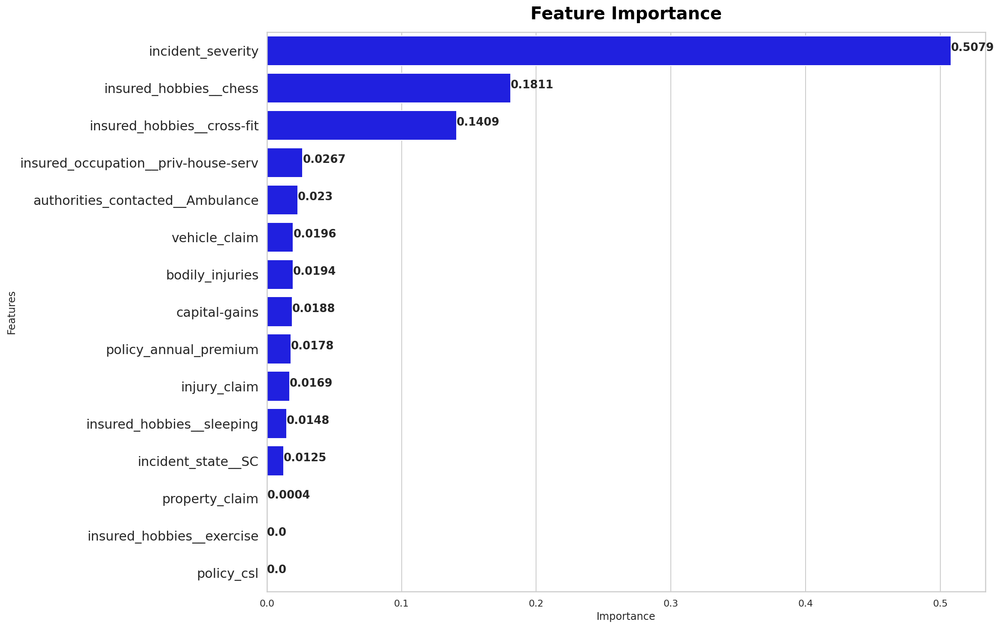

In [ ]:
plt.figure(figsize=(15, 12))
sns.barplot(data=feature_importance, x='Importance', y='Features', color='blue')

def addlabels(x,y):
    for i in range(len(x)):
        plt.text(x[i],i, round(x[i], 4), fontsize=13, fontweight='bold')

x = list(feature_importance['Importance'])
y = list(feature_importance['Features'])

plt.title('Feature Importance', fontsize=20, color='black', pad=15, fontweight='bold')
plt.yticks(fontsize=15)
addlabels(x, y)
plt.show()

Dari data diatas dapat terlihat bahwa ada 3 kolom yg memiliki dampak yg besar yaitu incident_severity, insured_hobbies_chess,insured_hobbies_corss-fit.

Jika dilihat dari hasil analisa maka hal ini memberikan jawaban yg sesuai dikarenakan, jenis kecelakaan dapat digunakan untuk membuat fraud, dan dari segi hobi "Chess" dan "Cross-Fit" yg paling besar presentasenya melakukan fraud.

In [ ]:
xgb = dx.Explainer(random_search_new.best_estimator_, X_train_new, y_train, label = "XGBOOST")

Preparation of a new explainer is initiated

  -> data              : 765 rows 15 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 765 values
  -> model_class       : xgboost.sklearn.XGBClassifier (default)
  -> label             : XGBOOST
  -> predict function  : <function yhat_proba_default at 0x7fbc0c178a70> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.206, mean = 0.349, max = 0.772
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.685, mean = -0.082, max = 0.794
  -> model_info        : package xgboost

A new explainer has been created!


In [ ]:
xgb.model_profile().plot()

Calculating ceteris paribus: 100%|██████████| 15/15 [00:01<00:00, 12.90it/s]


Bedasarkan dales pdp didapatkan Intrepetability sebagai berikut :

1. Bedasarkan jenis tingkat kecelakaan, Major Damage memiliki probabilitas sebesar 0.65.
2. Bedasarkan hobi, "Chess" memiliki probabilitas sebesar 0.7 dan "Cross-fit" memiliki probabilitas sebesar 0.62

Oleh karena itu apabila dikemudian hari terjadi laporan klaim asuransi dengan kriteria jenis kecelakaan "Major Damage" dengan pelapor memiliki hobi "Chess" dan "Cross-Fit" maka perlu dilakukan pemeriksaan secara detail dan mendalam dikarenakan ditakutkannya akan terjadinya fraud terhadap laporannya.


# 6.Gunakan LIME untuk melaukan interpretasi lokal pada beberapa nomor polis berikut:
527945

235220 

605100 

In [ ]:
a = X_test_new.reset_index()
a.head()

,policy_number,incident_severity,insured_hobbies__chess,insured_hobbies__cross-fit,insured_occupation__priv-house-serv,authorities_contacted__Ambulance,vehicle_claim,bodily_injuries,capital-gains,policy_annual_premium,injury_claim,insured_hobbies__exercise,insured_hobbies__sleeping,policy_csl,incident_state__SC,property_claim
0,687698,2,0,0,0,0,23100,2,35100,1413.14,7700,0,0,2,0,3850
1,367455,2,0,0,0,0,4550,0,66000,1583.91,1300,0,0,1,0,650
2,429027,3,0,0,0,0,32830,2,0,1137.03,9380,0,0,2,0,9380
3,558938,4,0,0,0,0,40530,1,63600,1199.44,5790,0,0,1,0,5790
4,143972,4,0,0,0,0,48320,2,57000,1475.73,6040,0,0,1,0,6040


In [ ]:
a[a["policy_number"]==527945]

,policy_number,incident_severity,insured_hobbies__chess,insured_hobbies__cross-fit,insured_occupation__priv-house-serv,authorities_contacted__Ambulance,vehicle_claim,bodily_injuries,capital-gains,policy_annual_premium,injury_claim,insured_hobbies__exercise,insured_hobbies__sleeping,policy_csl,incident_state__SC,property_claim
20,527945,3,0,0,0,0,38010,0,0,1307.11,10860,0,0,3,0,10860


In [ ]:
X_train_new.iloc[20]

incident_severity                         2.0
insured_hobbies__chess                    0.0
insured_hobbies__cross-fit                0.0
insured_occupation__priv-house-serv       0.0
authorities_contacted__Ambulance          0.0
vehicle_claim                          6560.0
bodily_injuries                           1.0
capital-gains                             0.0
policy_annual_premium                  1322.1
injury_claim                           1640.0
insured_hobbies__exercise                 0.0
insured_hobbies__sleeping                 0.0
policy_csl                                2.0
incident_state__SC                        0.0
property_claim                          820.0
Name: 863236, dtype: float64

In [ ]:
expXGB = explainer.explain_instance(data_row = X_test_new.iloc[20],
                                    predict_fn = random_search_new.best_estimator_.predict_proba,
                                    num_features=15)
expXGB.show_in_notebook(show_table=True)

Intercept 0.9802937842657906
Prediction_local [0.24237876]
Right: 0.20568943


Untuk data plat no 527945 tidak memiliki indikasi adanya laporan fraud, karena tidak memiliki faktor utama yg menyebabkan adanya laporan fraud, dan probabilitas untuk fraud hanya sebesar 0.21 yg bisa dikatakan cukup rendah.

In [ ]:
X_train_new.iloc[72]

incident_severity                          2.00
insured_hobbies__chess                     0.00
insured_hobbies__cross-fit                 0.00
insured_occupation__priv-house-serv        0.00
authorities_contacted__Ambulance           0.00
vehicle_claim                          50470.00
bodily_injuries                            1.00
capital-gains                              0.00
policy_annual_premium                   1352.83
injury_claim                            7210.00
insured_hobbies__exercise                  0.00
insured_hobbies__sleeping                  0.00
policy_csl                                 3.00
incident_state__SC                         1.00
property_claim                          7210.00
Name: 235220, dtype: float64

In [ ]:
explainer = LimeTabularExplainer(training_data=np.array(X_train_new),
        feature_names= X_train_new.columns,
        class_names=["no_fraud","fraud"],
        mode='classification',
        verbose=True,
        random_state=42)

In [ ]:
expXGB = explainer.explain_instance(data_row = X_train_new.iloc[72],
                                    predict_fn = random_search_new.best_estimator_.predict_proba,
                                    num_features=15)
expXGB.show_in_notebook(show_table=True)

Intercept 1.0515340558647988
Prediction_local [0.24143694]
Right: 0.20568943


Untuk data plat no 235220 tidak memiliki indikasi adanya laporan fraud, karena tidak memiliki faktor utama yg menyebabkan adanya laporan fraud, dan probabilitas untuk fraud hanya sebesar 0.21 yg bisa dikatakan cukup rendah.


In [ ]:
X_train_new.iloc[563]

incident_severity                          4.00
insured_hobbies__chess                     0.00
insured_hobbies__cross-fit                 0.00
insured_occupation__priv-house-serv        0.00
authorities_contacted__Ambulance           0.00
vehicle_claim                          54160.00
bodily_injuries                            2.00
capital-gains                              0.00
policy_annual_premium                   1042.25
injury_claim                            6770.00
insured_hobbies__exercise                  0.00
insured_hobbies__sleeping                  0.00
policy_csl                                 2.00
incident_state__SC                         0.00
property_claim                         20310.00
Name: 605100, dtype: float64

In [ ]:
expXGB = explainer.explain_instance(data_row = X_train_new.iloc[563],
                                    predict_fn = random_search_new.best_estimator_.predict_proba,
                                    num_features=15)
expXGB.show_in_notebook(show_table=True)

Intercept 0.8196940061903768
Prediction_local [0.58312795]
Right: 0.60123634


Untuk data plat no 605100 memiliki indikasi adanya laporan fraud, karena tidak memiliki faktor jenis kecelakaan "Major Damage" serta claim penggantiannya cukup besar dengan nilai 54160, dan probabilitas untuk fraud  sebesar 0.60 yg bisa dikatakan cukup tinggi.



In [ ]:
expXGB = explainer.explain_instance(data_row = X_test_new.iloc[20],
                                    predict_fn = random_search_new.best_estimator_.predict_proba,
                                    num_features=15)
expXGB.show_in_notebook(show_table=True)

Intercept 0.9733620752874015
Prediction_local [0.21753555]
Right: 0.20568943
